In [23]:
import torch
import random
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

import torch.nn as nn
import torch.nn.functional as F
import torch.optim

import math
import time
import os
import random

# Make the VF Solution and use it as input to network

import sys
sys.path.insert(0,'..')
import VF.vectorfit

In [24]:
device = torch.device('cuda:2' if torch.cuda.is_available() else 'cpu')
print(device)

cuda:2


# 1. Load the data and get measurements

In [25]:
ROOT_PATH = "/scratch/cluster/bodeng/UTAFSDataNew/new_data"
CHIP_NUM = 9

In [26]:
import utils

data_dict = utils.grab_chip_data(ROOT_PATH, CHIP_NUM)

In [27]:
data_dict.keys()

dict_keys(['gt_matrix', 'gt_freqs', 'vf_matrix', 'y_matrix', 'y_freqs'])

## Convert the raw data matrices to only the unique S-parameters

In [28]:
vf_data = utils.matrix_to_sparams(data_dict['vf_matrix'])
gt_data = utils.matrix_to_sparams(data_dict['gt_matrix'])
y_data = utils.matrix_to_sparams(data_dict['y_matrix'])

print("VF S-parameters shape: ", vf_data.shape)
print("GT S-parameters shape: ", gt_data.shape)
print("Y S-parameters shape: ", y_data.shape)

VF S-parameters shape:  (10, 2, 1000)
GT S-parameters shape:  (10, 2, 1000)
Y S-parameters shape:  (10, 2, 132)


In [29]:
gt_freqs = data_dict['gt_freqs']
y_freqs = data_dict['y_freqs']

print("GT frequencies shape: ", gt_freqs.shape)
print("Y frequencies shape: ", y_freqs.shape)

GT frequencies shape:  (1000,)
Y frequencies shape:  (132,)


In [30]:
import scipy as sp

spacings = gt_freqs[1:] - gt_freqs[:-1]

mode_spacing = sp.stats.mode(spacings, keepdims=False)[0]
num_mode = len(np.where(spacings==mode_spacing)[0])

print("First frequency point: ", gt_freqs[0])
print("Mean frequency spacing: ", np.mean(spacings))
print("STD frequency spacing: ", np.std(spacings))
print("Mode frequency spacing: ", mode_spacing)
print("Number of samples with non-equal spacing: ", len(gt_freqs) - num_mode)

First frequency point:  10.0
Mean frequency spacing:  20020020.01001001
STD frequency spacing:  28.29311577575365
Mode frequency spacing:  20020020.0
Number of samples with non-equal spacing:  501


In [31]:
#NOTE THIS IS EXPERIMENTAL!!!
if gt_freqs[0] == 0:
    gt_freqs = gt_freqs[1:]
    gt_data = gt_data[:, :, 1:]

## Make some variables we will need

In [32]:
N_FREQS = gt_data.shape[-1]
N_SPARAMS = gt_data.shape[0]  

print("N_FREQS: ", N_FREQS)
print("N_SPARAMS: ", N_SPARAMS)

N_FREQS:  1000
N_SPARAMS:  10


In [33]:
x = torch.from_numpy(gt_data).view(-1, N_FREQS).unsqueeze(0).to(device)

print("x shape: ", x.shape)

x shape:  torch.Size([1, 20, 1000])


In [34]:
x_mag = utils.sparams_to_mag(x)

print("x_mag shape: ", x_mag.shape)

x_mag shape:  torch.Size([1, 10, 1000])


## Plot some stuff

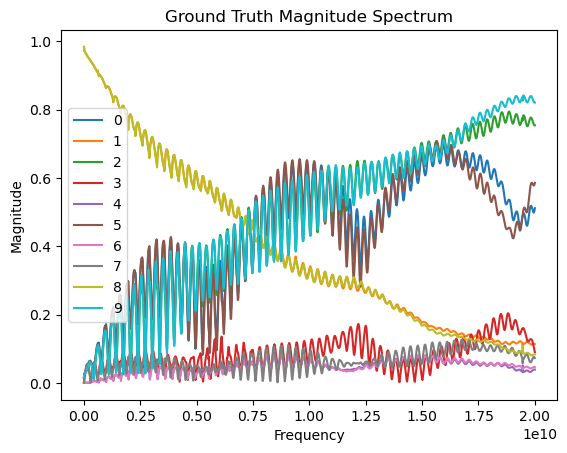

In [35]:
plt.figure()
for i in range(N_SPARAMS):
    plt.plot(gt_freqs, x_mag[0, i].cpu(), label=str(i))
if N_SPARAMS <= 10:
    plt.legend()
plt.title("Ground Truth Magnitude Spectrum")
plt.ylabel("Magnitude")
plt.xlabel("Frequency")
plt.show()

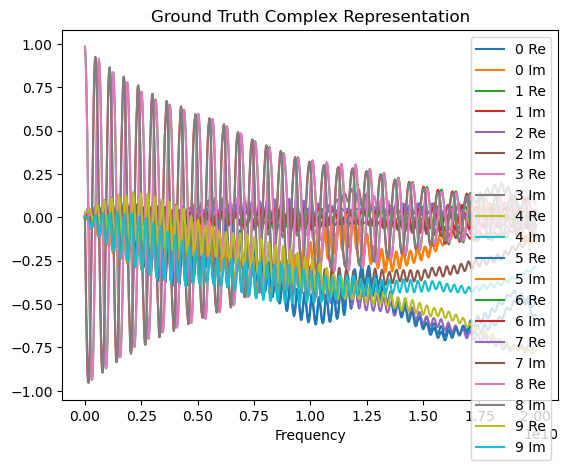

In [36]:
plt.figure()
for i in range(N_SPARAMS):
    plt.plot(gt_freqs, x[0,2*i].cpu(), label=str(i)+" Re")
    plt.plot(gt_freqs, x[0,2*i+1].cpu(), label=str(i)+" Im")
if N_SPARAMS <= 10:
    plt.legend()
plt.title("Ground Truth Complex Representation")
plt.xlabel("Frequency")
plt.show()

## Grab Some Measurements

In [37]:
PROBLEM_TYPE = "equal" #[random, equal, forecast, full, log, sqrt]
# M = int(0.10 * N_FREQS)
M = 132

kept_inds, missing_inds = utils.get_inds(PROBLEM_TYPE, N_FREQS, M)
old_kept = kept_inds.copy()

M = len(kept_inds) #re-define in case kept_inds is off by 1 or something

# remove every other point, starting at the back, don't remove first point
remove = False
for i in range(len(kept_inds) - 1, 0, -1):
    if remove:
        kept_inds = np.delete(kept_inds, [i])
        remove = False
    else:
        remove = True

print("Number of Ground Truth Frequency Points: ", N_FREQS)
print("Number of Measurements: ", M)
print("Undersampling Ratio: ", M/N_FREQS)
print(kept_inds)
print(old_kept)

Number of Ground Truth Frequency Points:  1000
Number of Measurements:  132
Undersampling Ratio:  0.132
[  0   7  22  38  53  68  83  99 114 129 144 160 175 190 205 221 236 251
 266 282 297 312 327 343 358 373 388 404 419 434 449 465 480 495 510 526
 541 556 571 587 602 617 632 648 663 678 693 709 724 739 754 770 785 800
 815 831 846 861 876 892 907 922 937 953 968 983 999]
[  0   7  15  22  30  38  45  53  61  68  76  83  91  99 106 114 122 129
 137 144 152 160 167 175 183 190 198 205 213 221 228 236 244 251 259 266
 274 282 289 297 305 312 320 327 335 343 350 358 366 373 381 388 396 404
 411 419 427 434 442 449 457 465 472 480 488 495 503 510 518 526 533 541
 549 556 564 571 579 587 594 602 610 617 625 632 640 648 655 663 671 678
 686 693 701 709 716 724 732 739 747 754 762 770 777 785 793 800 808 815
 823 831 838 846 854 861 869 876 884 892 899 907 915 922 930 937 945 953
 960 968 976 983 991 999]


In [38]:
y = torch.clone(x)[:, :, kept_inds]
y_freqs = gt_freqs[kept_inds]

print("y shape: ", y.shape)
print("y_freqs shape: ", y_freqs.shape)

y shape:  torch.Size([1, 20, 67])
y_freqs shape:  (67,)


# 2. Network Setup

## Define network parameters

In [39]:
NZ = y.shape[1]

NUM_LAYERS = int(np.ceil(np.log2(N_FREQS))) - 4

if NZ < 64:
    BASE_NGF = 2 ** (int(np.ceil(np.log2(NZ))) + 1) #second power of two after NZ 
elif NZ < 128:
    BASE_NGF = 2 ** int(np.ceil(np.log2(NZ))) #next highest power of 2
else:
    BASE_NGF = NZ

NGF = [BASE_NGF] * NUM_LAYERS

BS = y.shape[0]
NC = y.shape[1]

KERNEL_SIZE = 3
USE_SKIP = False
CAUSAL_PASSIVE = True
OPTIMIZE_Z = False
USE_SGLD = False

In [40]:
print("NZ: ", str(NZ))
print("NUM_LAYERS: ", str(NUM_LAYERS))
print("BASE NGF: ", str(BASE_NGF))
print("NGF: ", str(NGF))
print("BS: ", BS)
print("NC: ", NC)
print("KERNEL_SIZE: ", KERNEL_SIZE)
print("USE_SKIP: ", USE_SKIP)
print("CAUSAL_PASSIVE: ", CAUSAL_PASSIVE)
print("OPTIMIZE_Z: ", OPTIMIZE_Z)

NZ:  20
NUM_LAYERS:  6
BASE NGF:  64
NGF:  [64, 64, 64, 64, 64, 64]
BS:  1
NC:  20
KERNEL_SIZE:  3
USE_SKIP:  False
CAUSAL_PASSIVE:  True
OPTIMIZE_Z:  False


## Init and check dimensions

In [41]:
from models import RES_UNET

net = RES_UNET(bs=BS,
               nz=NZ,
               ngf=NGF,
               output_size=N_FREQS,
               nc=NC,
               optimize_z=OPTIMIZE_Z,
               kernel_size=KERNEL_SIZE,
               num_layers=NUM_LAYERS,
               use_skip=USE_SKIP,
               causal_passive=CAUSAL_PASSIVE,
               p_dropout=0.0
               )
net = net.to(device)

In [42]:
test_out = net.forward_with_z()

print("Net output shape: ", test_out.shape)

Net output shape:  torch.Size([1, 20, 1000])


In [43]:
pytorch_total_params = sum(p.numel() for p in net.parameters() if p.requires_grad)

print("TOTAL PARAMS: ", pytorch_total_params)

TOTAL PARAMS:  349384


# 3. Run

## Define training parameters, losses, and track stats

In [44]:
#grab the correct file we want for VF
NUM_ACTIVE = M - len(kept_inds)

LR = 2e-4
FIRST_ITER = 20000
NUM_ITER = 2000
CURR_ITER = FIRST_ITER
TOTAL_ITERS = FIRST_ITER + NUM_ITER * NUM_ACTIVE
NUM_BURN_ITER = NUM_ITER * 0 # 0.2
SAMPLE_EVERY = 40

ACTIVE_ITER_RATIO = 0.1
SAMPLE_LAST_N = NUM_ITER * ACTIVE_ITER_RATIO

# TODO: maybe come back to this?
# TOTAL_ITER = NUM_ITER + 0.1 * NUM_ACTIVE * NUM_ITER

REG_HYPERPARAM = 1.0
NOISY_INPUT = True
USE_SGLD = False

if REG_HYPERPARAM > 0:
    regularizer = utils.Smoothing_Loss(per_param=False, reduction="sum")
    regularizer = regularizer.to(device)

optim = torch.optim.Adam(net.parameters(), lr=LR)

def get_lr(optim):
    for g in optim.param_groups:
        return g['lr']
    
def set_lr(optim, lr):
    for g in optim.param_groups:
        g['lr'] = lr
        
START_NOISE_LEVEL = CUR_NOISE_LEVEL = 1.0
END_NOISE_LEVEL = 0.001
NOISE_DECAY_FACTOR = (END_NOISE_LEVEL / START_NOISE_LEVEL)**(1 / TOTAL_ITERS) 

train_losses = []
train_errors = []
if REG_HYPERPARAM > 0:
    train_regs = []

test_mses = []
test_maes = []

is_initial_fit = True
tic = time.time()
net.train()

# (NUM_ACTIVE + 1) * NUM_OUTPUTS * S_PARAMS * FREQS
sgld_outputs_by_sample = []
# (NUM_ACTIVE + 1) * S_PARAMS * FREQS
sgld_means_by_sample = []
# (NUM_ACTIVE + 1) * S_PARAMS * FREQS
sgld_stds_by_sample = []

print("NUM ACTIVE: ", NUM_ACTIVE)

for num_actively_sampled in range(NUM_ACTIVE + 1):

    cur_sgld_outputs = torch.Tensor().to(device)   

    if not is_initial_fit:

        LENGTH_GT = len(gt_freqs)
        cn = str(CHIP_NUM) if CHIP_NUM > 9 else "0" + str(CHIP_NUM)
        fname = os.path.join(ROOT_PATH, "case"+cn)

        children = os.listdir(fname)
        children = [f for f in children if cn + ".s" in f]

        final_path = os.path.join(fname, children[0])

        fitter = VF.vectorfit.VectorFitter(final_path)
        fit1 = fitter.vector_fit("VF Result", y_freqs) 
        vf_output = fit1.fitted_network.s

        vf_data = np.stack((vf_output.real, vf_output.imag), axis=-1)
        vf_data = utils.matrix_to_sparams(vf_data)
        vf_data = torch.tensor(vf_data).view(1, -1, LENGTH_GT)
        vf_data = vf_data.to(device)

        
        # Find the maximum standard deviation point, and use it to update kept_inds
        print(sgld_outputs_by_sample)
        max_disagree_idx = find_max_variance(sgld_outputs_by_sample[-1][-1], vf_data, pickRandom=False)
        kept_inds = np.sort(np.append(kept_inds, max_disagree_idx))
        print(kept_inds)

        # Recreate the y data with the new kept_inds
        y = torch.clone(x)[:, :, kept_inds]
        y_freqs = gt_freqs[kept_inds]


    # Update the criterion to reflect the new point we have sampled
    criterion = utils.Measurement_MSE_Loss(kept_inds=kept_inds, per_param=False, reduction="sum")
    criterion = criterion.to(device)

    for i in range(int(CURR_ITER)):
        optim.zero_grad()
        
        if NOISY_INPUT:
            out = net.forward_with_z(CUR_NOISE_LEVEL)
            CUR_NOISE_LEVEL *= NOISE_DECAY_FACTOR
        else:
            out = net.forward_with_z()
        
        train_error = criterion(out, y) 
        if REG_HYPERPARAM > 0:
            train_reg = REG_HYPERPARAM * regularizer(out)
            train_loss = train_error + train_reg
        else:
            train_loss = train_error
        
        train_loss.backward()
        optim.step()

        with torch.no_grad():
            # First 20% of training will be burn-in iterations
            if (not is_initial_fit or i > NUM_BURN_ITER) and USE_SGLD:
                # Perform SGLD by adding Gaussian noise to parameters after gradient descent
                for param in net.parameters():
                    # param.add_(torch.normal(0, get_lr(optim), size=param.size()).to(device))
                    param.add_(torch.randn_like(param) * get_lr(optim) * 2)
            
            # Log the standard metrics across different numbers of samples given
            train_losses.append(train_loss.item())
            train_errors.append(train_error.item())
            if REG_HYPERPARAM > 0:
                train_regs.append(train_reg.item())
            
            test_mse = nn.MSELoss()(out, x)
            test_mses.append(test_mse.item())
            
            test_mae = nn.L1Loss()(out, x)
            test_maes.append(test_mae.item())

            if (i+1)%1000 == 0 or i == 0:
                toc = time.time()
                print("ITER ", str(i))
                print("TIME: ", str(toc - tic))
                if NOISY_INPUT:
                    print("NOISE LEVEL: ", CUR_NOISE_LEVEL)
                print()

            # Get SGLD outputs for finding mean/std
            if (NUM_ITER - i <= SAMPLE_LAST_N) and i % SAMPLE_EVERY == 0:
                cur_sgld_outputs = torch.cat([cur_sgld_outputs, out])

    sgld_outputs_by_sample.append(cur_sgld_outputs)
    sgld_means_by_sample.append(torch.mean(cur_sgld_outputs, dim=0))
    sgld_stds_by_sample.append(torch.std(cur_sgld_outputs, dim=0))

    if is_initial_fit :
    #     NUM_ITER *= ACTIVE_ITER_RATIO
        CURR_ITER = NUM_ITER
        is_initial_fit = False


    def find_max_variance(outputs, vf_outputs, pickRandom=False):
        # Outputs of shape [NUM_OUTPUTS, 20, 1000]

        # Call np.var with dim = 0 to get shape [20, 1000]
        print(vf_outputs.shape)
        print(outputs.shape)
        sqr_differences = torch.square(torch.subtract(vf_outputs[0], outputs))

        # Sum to go to [1000]
        sqr_differences = torch.mean(sqr_differences, dim=0)

        if pickRandom:
            while True:
                rand_idx = random.randint(0, len(sqr_differences) - 1)
                if rand_idx not in kept_inds:
                    print("picked: ", rand_idx)
                    return rand_idx

        _, idxs = torch.topk(sqr_differences, len(sqr_differences))

        for idx in idxs:
            if idx.item() not in kept_inds:
                return idx.item()
        return -1
    
    print("NUM_SAMPLES ", str(num_actively_sampled))
    print("TIME: ", str(toc - tic))


NUM ACTIVE:  65
ITER  0
TIME:  4.04085636138916
NOISE LEVEL:  0.9999539493585035

ITER  999
TIME:  36.76490783691406
NOISE LEVEL:  0.9549925860214311

ITER  1999
TIME:  69.34836387634277
NOISE LEVEL:  0.9120108393558993

ITER  2999
TIME:  101.65242338180542
NOISE LEVEL:  0.8709635899560662

ITER  3999
TIME:  130.0430188179016
NOISE LEVEL:  0.8317637711026543

ITER  4999
TIME:  163.01352334022522
NOISE LEVEL:  0.7943282347242605

ITER  5999
TIME:  196.70397853851318
NOISE LEVEL:  0.7585775750291576

ITER  6999
TIME:  229.68798208236694
NOISE LEVEL:  0.7244359600749617

ITER  7999
TIME:  262.3855104446411
NOISE LEVEL:  0.691830970918906

ITER  8999
TIME:  295.27549409866333
NOISE LEVEL:  0.6606934480075611

ITER  9999
TIME:  328.2904851436615
NOISE LEVEL:  0.6309573444801552

ITER  10999
TIME:  361.32739090919495
NOISE LEVEL:  0.6025595860743173

ITER  11999
TIME:  394.83080196380615
NOISE LEVEL:  0.5754399373371156

ITER  12999
TIME:  428.7906196117401
NOISE LEVEL:  0.5495408738575812



/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Replacing d_res solution as it was too small. This is not a good sign and probably means that more starting poles are required
  vf.vector_fit(n_poles_cmplx=n_poles)
/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: UserWarning: The fitted network is passive, but the vector fit is not passive. Consider running `passivity_enforce()` to enforce passivity before using this model.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.08864757232367992 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 was not subtantially better than 2 (err 1.5448714723999908 vs 1.3127334359018223)
Performing fit with 3 poles.
  Fitting took 0.7678589839488268 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 was not subtantially better than 2 (err 1.562675235496107 vs 1.3127334359018223)
Performing fit with 4 poles.
  Fitting took 1.524430988356471 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 poles better than 2 (err 0.9858373916261007 vs 1.3127334359018223)
Performing fit with 5 poles.
  Fitting took 0.3276985362172127 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 was not subtantially better than 5 (err 1.0147264557448614 vs 0.9858373916261007)
Performing fit with 6 poles.
  Fitting took 0.7471934240311384 seconds.
 

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 293796476856757.0). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.3217970598489046 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 5 (err 0.9994866301309147 vs 0.9858373916261007)
Fit completed in 4.2314112186431885, using 7, resulting in a fit with 5 and error=0.9858373916261007 vs samples and error=1.2500004418258774 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ..., -5.2713e-02,
          -5.7998e-02, -5.5258e-02],
         [-7.7701e-02, -6.5886e-02, -4.3292e-02,  ..., -8.1912e-01,
          -8.8545e-01, -9.2948e-01],
         [ 1.3577e-02,  3.8414e-02,  5.3361e-02,  ..., -3.9103e-01,
          -3.9524e-0

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 570248314892734.0). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.8827998209744692 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 2 (err 1.6140618958432726 vs 1.6669406358276222)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 570904161772493.0). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.6148983780294657 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 poles better than 4 (err 1.141319841653325 vs 1.6140618958432726)
Performing fit with 5 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 571195979251737.2). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.058811729773879 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 was not subtantially better than 5 (err 1.1669983537221575 vs 1.141319841653325)
Performing fit with 6 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 573305455548574.2). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.28376570902764797 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 was not subtantially better than 5 (err 1.5129447874596047 vs 1.141319841653325)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process barely converged to tolerance. It took the max. number of iterations (N_max = 100). The results might not have converged properly. Hint: the linear system was ill-conditioned (max. condition number = 575665206106410.5). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.47168147191405296 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 poles better than 5 (err 0.9896187058250531 vs 1.141319841653325)
Performing fit with 8 poles.
  Fitting took 0.710518354550004 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 poles better than 8 (err 0.8659284660520916 vs 0.9896187058250531)
Performing fit with 9 poles.
  Fitting took 2.17035049200058 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 9 (err 0.9723759793305955 vs 0.8659284660520916)
Performing fit with 10 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 575319433705257.6). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.3086718320846558 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 12 was not subtantially better than 9 (err 1.0375674921917228 vs 0.8659284660520916)
Performing fit with 11 poles.
  Fitting took 1.4554426725953817 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 12 poles better than 9 (err 0.813847841245385 vs 0.8659284660520916)
Performing fit with 12 poles.
  Fitting took 0.5860192235559225 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 13 poles better than 12 (err 0.3619142211998916 vs 0.813847841245385)
Performing fit with 13 poles.
  Fitting took 0.4315196331590414 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 14 was not subtantially better than 13 (err 0.6211794237147101 vs 0.3619142211998916)
Performing fit with 14 poles.
  Fitting took 3.389211231842637 seconds.
  Fillin

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 317468127601539.44). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.288667781278491 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 2 (err 1.5991975707087611 vs 1.6679458022811224)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process barely converged to tolerance. It took the max. number of iterations (N_max = 100). The results might not have converged properly. Hint: the linear system was ill-conditioned (max. condition number = 317733090278522.25). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.37114684469997883 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 poles better than 4 (err 1.1436475470038008 vs 1.5991975707087611)
Performing fit with 5 poles.
  Fitting took 0.5435405187308788 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 5 (err 0.9399495309735921 vs 1.1436475470038008)
Performing fit with 6 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 319110945053709.25). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.8857112228870392 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 was not subtantially better than 6 (err 1.493381289263682 vs 0.9399495309735921)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 319969499477099.06). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 2.6633835565298796 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 6 (err 1.0010613938872537 vs 0.9399495309735921)
Performing fit with 8 poles.
  Fitting took 3.091273123398423 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 6 (err 1.0931499481880111 vs 0.9399495309735921)
Fit completed in 10.089298963546753, using 8, resulting in a fit with 6 and error=0.9399495309735921 vs samples and error=1.2170916964667204 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ..., -

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 351923449840131.8). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 2.767192231491208 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 was not subtantially better than 3 (err 1.7050346543777808 vs 1.3754317061990085)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 352093776901332.4). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.9223031587898731 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 poles better than 3 (err 0.8156373364608549 vs 1.3754317061990085)
Performing fit with 5 poles.
  Fitting took 1.222516480833292 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 was not subtantially better than 5 (err 1.0564295501072993 vs 0.8156373364608549)
Performing fit with 6 poles.
  Fitting took 3.3472086638212204 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 was not subtantially better than 5 (err 1.064385621644613 vs 0.8156373364608549)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 353089447534331.4). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.5755484607070684 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 5 (err 0.9526443293569186 vs 0.8156373364608549)
Fit completed in 11.942320108413696, using 7, resulting in a fit with 5 and error=0.8156373364608549 vs samples and error=1.0074817563872025 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ..., -5.2713e-02,
          -5.7998e-02, -5.5258e-02],
         [-7.7701e-02, -6.5886e-02, -4.3292e-02,  ..., -8.1912e-01,
          -8.8545e-01, -9.2948e-01],
         [ 1.3577e-02,  3.8414e-02,  5.3361e-02,  ..., -3.9103e-01,
          -3.9524e-0

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 610214576269296.8). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 2.7757257279008627 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 was not subtantially better than 3 (err 1.845896019502621 vs 1.3504751129050205)
Performing fit with 4 poles.
  Fitting took 2.5915257558226585 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 poles better than 3 (err 0.9367436759186514 vs 1.3504751129050205)
Performing fit with 5 poles.
  Fitting took 2.5692846309393644 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 was not subtantially better than 5 (err 1.1025441254202653 vs 0.9367436759186514)
Performing fit with 6 poles.
  Fitting took 2.5527447815984488 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 was not subtantially better than 5 (err 1.1100311514830037 vs 0.9367436759186514)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 613467853518124.5). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 4.277836315333843 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 5 (err 0.961713176475467 vs 0.9367436759186514)
Fit completed in 16.27445960044861, using 7, resulting in a fit with 5 and error=0.9367436759186514 vs samples and error=0.9616782343966319 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ..., -5.2713e-02,
          -5.7998e-02, -5.5258e-02],
         [-7.7701e-02, -6.5886e-02, -4.3292e-02,  ..., -8.1912e-01,
          -8.8545e-01, -9.2948e-01],
         [ 1.3577e-02,  3.8414e-02,  5.3361e-02,  ..., -3.9103e-01,
          -3.9524e-01, 

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 695652223080429.6). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.7412911877036095 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 7 (err 1.7874019487678694 vs 1.0307780795646515)
Performing fit with 8 poles.
  Fitting took 3.8358228728175163 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 poles better than 7 (err 0.8833043131516088 vs 1.0307780795646515)
Performing fit with 9 poles.
  Fitting took 2.9518146943300962 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 9 (err 0.9956891957091497 vs 0.8833043131516088)
Performing fit with 10 poles.
  Fitting took 3.415930727496743 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 9 (err 1.0612460135521364 vs 0.8833043131516088)
Performing fit with 11 poles.
  Fitting took 4.662112016230822 seconds

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 340360097362552.6). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.10655331611633301 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 poles better than 2 (err 1.3485324469939477 vs 1.6319642297733576)
Performing fit with 3 poles.
  Fitting took 0.18628085404634476 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 was not subtantially better than 3 (err 1.7869632333401704 vs 1.3485324469939477)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 341161920176148.5). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.26392908953130245 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 3 (err 1.6884811187976903 vs 1.3485324469939477)
Performing fit with 5 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 341295150488519.56). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.42041078954935074 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 3 (err 1.0842606396259176 vs 1.3485324469939477)
Performing fit with 6 poles.
  Fitting took 0.28266259655356407 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 was not subtantially better than 6 (err 1.1006010523741494 vs 1.0842606396259176)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 342761641939893.2). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.338667681440711 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 6 (err 1.7833642234931761 vs 1.0842606396259176)
Performing fit with 8 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 343170150018210.5). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.38072055764496326 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 poles better than 6 (err 0.9555721888347759 vs 1.0842606396259176)
Performing fit with 9 poles.
  Fitting took 0.34289420768618584 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 poles better than 9 (err 0.7620672311402702 vs 0.9555721888347759)
Performing fit with 10 poles.
  Fitting took 1.5729750338941813 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 10 (err 0.7670307436825816 vs 0.7620672311402702)
Performing fit with 11 poles.
  Fitting took 2.1141088642179966 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 12 was not subtantially better than 10 (err 1.0523104243387649 vs 0.7620672311402702)
Performing fit with 12 poles.
  Fitting took 25.831965757533908 seconds.
  Fil

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 597851949649469.8). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 28.825437569990754 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 15 was not subtantially better than 13 (err 0.48270848699744356 vs 0.3889304200955056)
Performing fit with 15 poles.
  Fitting took 15.413564220070839 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 16 was not subtantially better than 13 (err 0.6464754269956889 vs 0.3889304200955056)
Fit completed in 84.16548204421997, using 15, resulting in a fit with 13 and error=0.3889304200955056 vs samples and error=0.3963183587590633 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 267914366861086.12). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.19105971045792103 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
Performing fit with 2 poles.
  Fitting took 0.14496941678225994 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 poles better than 2 (err 1.3561115629219633 vs 1.4863231465148856)
Performing fit with 3 poles.
  Fitting took 1.6750107444822788 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 was not subtantially better than 3 (err 1.7960755804257214 vs 1.3561115629219633)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 268403295875450.44). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.5461123958230019 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 3 (err 1.666602956796437 vs 1.3561115629219633)
Performing fit with 5 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 268450974002705.7). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.36597386561334133 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 3 (err 1.0707681977661663 vs 1.3561115629219633)
Performing fit with 6 poles.
  Fitting took 0.3766610510647297 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 was not subtantially better than 6 (err 1.089428568657188 vs 1.0707681977661663)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 269222868228429.94). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.2260540388524532 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 6 (err 1.793900957904662 vs 1.0707681977661663)
Performing fit with 8 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 269367557911012.47). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 2.9854480158537626 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 poles better than 6 (err 0.8997421325906718 vs 1.0707681977661663)
Performing fit with 9 poles.
  Fitting took 1.8545980509370565 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 9 (err 1.0223628934275655 vs 0.8997421325906718)
Performing fit with 10 poles.
  Fitting took 0.6159858014434576 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 poles better than 9 (err 0.7668047639436478 vs 0.8997421325906718)
Performing fit with 11 poles.
  Fitting took 0.5697113499045372 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 12 was not subtantially better than 11 (err 1.0384092084424177 vs 0.7668047639436478)
Performing fit with 12 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 422158371802145.56). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 5.606690227985382 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 13 poles better than 11 (err 0.7265890405287179 vs 0.7668047639436478)
Performing fit with 13 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 422001585779676.6). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 3.3417339231818914 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 14 poles better than 13 (err 0.41976157596827146 vs 0.7265890405287179)
Performing fit with 14 poles.
  Fitting took 12.533366585150361 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 15 was not subtantially better than 14 (err 0.6661632183227741 vs 0.41976157596827146)
Performing fit with 15 poles.
  Fitting took 4.870314154773951 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 16 was not subtantially better than 14 (err 0.669818337307785 vs 0.41976157596827146)
Performing fit with 16 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 441197364383969.9). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 10.333659367635846 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 17 was not subtantially better than 14 (err 0.7059484903067419 vs 0.41976157596827146)
Fit completed in 50.06950092315674, using 16, resulting in a fit with 14 and error=0.41976157596827146 vs samples and error=0.42008344571787853 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ..., -5.2713e-02,
          -5.7998e-02, -5.5258e-02],
         [-7.7701e-02, -6.5886e-02, -4.3292e-02,  ..., -8.1912e-01,
          -8.8545e-01, -9.2948e-01],
         [ 1.3577e-02,  3.8414e-02,  5.3361e-02,  ..., -3.9103e-01,
          -3.9

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 788607740085394.9). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.4106649998575449 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 3 (err 1.5050540603462643 vs 1.3622518103704286)
Performing fit with 5 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 788845037391201.9). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.390292352065444 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 3 (err 1.0618296001212304 vs 1.3622518103704286)
Performing fit with 6 poles.
  Fitting took 0.5063940491527319 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 was not subtantially better than 6 (err 1.0809324879948434 vs 1.0618296001212304)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 797104630251841.5). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.3428787309676409 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 6 (err 1.805067050657966 vs 1.0618296001212304)
Performing fit with 8 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 791417654580875.2). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 2.4068987239152193 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 poles better than 6 (err 0.916366199318894 vs 1.0618296001212304)
Performing fit with 9 poles.
  Fitting took 1.6076377127319574 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 9 (err 1.0899056273586027 vs 0.916366199318894)
Performing fit with 10 poles.
  Fitting took 1.4262202698737383 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 poles better than 9 (err 0.8848634290977959 vs 0.916366199318894)
Performing fit with 11 poles.
  Fitting took 0.9500990528613329 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 12 was not subtantially better than 11 (err 1.0895551952332836 vs 0.8848634290977959)
Performing fit with 12 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 865915113889011.9). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 7.427439855411649 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 13 was not subtantially better than 11 (err 1.1154818362261896 vs 0.8848634290977959)
Performing fit with 13 poles.
  Fitting took 2.585739888250828 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 14 poles better than 11 (err 0.3874459180325284 vs 0.8848634290977959)
Performing fit with 14 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 835141232425826.4). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 23.526755331084132 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 15 was not subtantially better than 14 (err 0.40813350069253546 vs 0.3874459180325284)
Performing fit with 15 poles.
  Fitting took 18.364074984565377 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 16 was not subtantially better than 14 (err 0.6846243584165026 vs 0.3874459180325284)
Performing fit with 16 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 944757561286129.5). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 35.903502717614174 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 17 was not subtantially better than 14 (err 0.7210782199813994 vs 0.3874459180325284)
Fit completed in 101.09716010093689, using 16, resulting in a fit with 14 and error=0.3874459180325284 vs samples and error=0.44463438290870194 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ..., -5.2713e-02,
          -5.7998e-02, -5.5258e-02],
         [-7.7701e-02, -6.5886e-02, -4.3292e-02,  ..., -8.1912e-01,
          -8.8545e-01, -9.2948e-01],
         [ 1.3577e-02,  3.8414e-02,  5.3361e-02,  ..., -3.9103e-01,
          -3.95

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 193376682621171.56). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.25784108415246 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 3 (err 1.586137892475063 vs 1.3555757460793818)
Performing fit with 5 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 193471227276584.75). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.27441681921482086 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 3 (err 1.0782807937524777 vs 1.3555757460793818)
Performing fit with 6 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 194055973191475.1). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.3045866210013628 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 poles better than 6 (err 1.0738953495453665 vs 1.0782807937524777)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 194134852851985.56). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.3296199105679989 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 7 (err 1.8107056473450185 vs 1.0738953495453665)
Performing fit with 8 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 194608126624052.7). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.3766591567546129 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 poles better than 7 (err 0.9689938084776685 vs 1.0738953495453665)
Performing fit with 9 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 194574539649161.4). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.41770431585609913 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 9 (err 1.0891522328368777 vs 0.9689938084776685)
Performing fit with 10 poles.
  Fitting took 0.34159008599817753 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 poles better than 9 (err 0.7767298207029388 vs 0.9689938084776685)
Performing fit with 11 poles.
  Fitting took 0.7401866838335991 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 12 was not subtantially better than 11 (err 1.103701165732135 vs 0.7767298207029388)
Performing fit with 12 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 201715040851305.12). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 4.639625968411565 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 13 poles better than 11 (err 0.7195115154443433 vs 0.7767298207029388)
Performing fit with 13 poles.
  Fitting took 1.8411193508654833 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 14 was not subtantially better than 13 (err 0.7723020169651074 vs 0.7195115154443433)
Performing fit with 14 poles.
  Fitting took 9.944391388446093 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 15 poles better than 13 (err 0.36693322906550746 vs 0.7195115154443433)
Performing fit with 15 poles.
  Fitting took 5.943850992247462 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 16 was not subtantially better than 15 (err 0.6814480354139688 vs 0.36693322906550746)
Performing fit with 16 poles.
  Fitting took 2.4967534374445677 seconds.
  Fi

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 205517331376650.16). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.6663716528564692 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 18 was not subtantially better than 17 (err 0.742122707154887 vs 0.30386653827197)
Performing fit with 18 poles.
  Fitting took 6.706447334960103 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 19 was not subtantially better than 17 (err 0.312427217469406 vs 0.30386653827197)
Performing fit with 19 poles.
  Fitting took 1.235485102981329 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 20 was not subtantially better than 17 (err 0.3307356131624533 vs 0.30386653827197)
Fit completed in 42.310020208358765, using 19, resulting in a fit with 17 and error=0.30386653827197 vs samples and error=0.41361837752522007 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 677814839741320.2). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.9697503037750721 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 3 (err 1.6260838807486346 vs 1.3500519841899399)
Performing fit with 5 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 678344153241722.0). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.4600025862455368 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 3 (err 1.0887844431579683 vs 1.3500519841899399)
Performing fit with 6 poles.
  Fitting took 0.4738058652728796 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 was not subtantially better than 6 (err 1.527436191947555 vs 1.0887844431579683)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 683768878015587.4). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.6218514833599329 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 6 (err 1.8143465771095553 vs 1.0887844431579683)
Performing fit with 8 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 681144149939313.1). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.556987952440977 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 poles better than 6 (err 0.8605299231574652 vs 1.0887844431579683)
Performing fit with 9 poles.
  Fitting took 1.8629151601344347 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 poles better than 9 (err 0.7666888810148551 vs 0.8605299231574652)
Performing fit with 10 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 633951227158349.8). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 4.03764932602644 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 10 (err 1.0857139573132368 vs 0.7666888810148551)
Performing fit with 11 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 640620190539416.9). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.8444721177220345 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 12 was not subtantially better than 10 (err 1.1103579776593575 vs 0.7666888810148551)
Performing fit with 12 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 625983516057866.6). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 2.0930863805115223 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 13 poles better than 10 (err 0.7125441243860382 vs 0.7666888810148551)
Performing fit with 13 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 639701789451554.8). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 35.32995084300637 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 14 was not subtantially better than 13 (err 0.7863223916950928 vs 0.7125441243860382)
Performing fit with 14 poles.
  Fitting took 5.007168164476752 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 15 was not subtantially better than 13 (err 0.8039419908099045 vs 0.7125441243860382)
Performing fit with 15 poles.
  Fitting took 4.831461159512401 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 16 poles better than 13 (err 0.7031652133842076 vs 0.7125441243860382)
Performing fit with 16 poles.
  Fitting took 4.337911911308765 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 17 was not subtantially better than 16 (err 0.7190885955351293 vs 0.7031652133842076)
Performing fit with 17 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 622891050065348.0). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 4.982435325160623 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 18 was not subtantially better than 16 (err 0.7387146310225682 vs 0.7031652133842076)
Performing fit with 18 poles.
  Fitting took 1.4764702692627907 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 19 poles better than 16 (err 0.25634495020952713 vs 0.7031652133842076)
Performing fit with 19 poles.
  Fitting took 1.757025957107544 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 20 was not subtantially better than 19 (err 0.26647333721145366 vs 0.25634495020952713)
Performing fit with 20 poles.
  Fitting took 7.640392450615764 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 21 poles better than 19 (err 0.23207940285381004 vs 0.25634495020952713)
Performing fit with 21 poles.
  Fitting took 1.4848454929888248 seconds.
 

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 435852780766755.9). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 2.047890515998006 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 poles better than 3 (err 1.0612840497158027 vs 1.3534759831713215)
Performing fit with 5 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 435930498887621.75). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.4184315428137779 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 was not subtantially better than 5 (err 1.0838248561514778 vs 1.0612840497158027)
Performing fit with 6 poles.
  Fitting took 0.32112404704093933 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 was not subtantially better than 5 (err 1.1009016868581731 vs 1.0612840497158027)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 437972187378635.06). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.5950450077652931 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 5 (err 1.819778858787261 vs 1.0612840497158027)
Fit completed in 5.638172149658203, using 7, resulting in a fit with 5 and error=1.0612840497158027 vs samples and error=1.606455668292069 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ..., -5.2713e-02,
          -5.7998e-02, -5.5258e-02],
         [-7.7701e-02, -6.5886e-02, -4.3292e-02,  ..., -8.1912e-01,
          -8.8545e-01, -9.2948e-01],
         [ 1.3577e-02,  3.8414e-02,  5.3361e-02,  ..., -3.9103e-01,
          -3.9524e-01, 

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 640081049810985.0). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.11820155009627342 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 poles better than 2 (err 1.5971543604240306 vs 1.737843765549368)
Performing fit with 3 poles.
  Fitting took 0.3924770634621382 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 3 (err 1.3925076156535259 vs 1.5971543604240306)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 640614462041106.5). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.7012392934411764 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 poles better than 4 (err 0.9815496538030594 vs 1.3925076156535259)
Performing fit with 5 poles.
  Fitting took 0.28119002655148506 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 was not subtantially better than 5 (err 1.09999163141173 vs 0.9815496538030594)
Performing fit with 6 poles.
  Fitting took 0.2601097449660301 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 was not subtantially better than 5 (err 1.113578943013477 vs 0.9815496538030594)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 645590845826465.8). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.5976415723562241 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 5 (err 1.7479311021536437 vs 0.9815496538030594)
Fit completed in 2.7510082721710205, using 7, resulting in a fit with 5 and error=0.9815496538030594 vs samples and error=1.602983744114809 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ..., -5.2713e-02,
          -5.7998e-02, -5.5258e-02],
         [-7.7701e-02, -6.5886e-02, -4.3292e-02,  ..., -8.1912e-01,
          -8.8545e-01, -9.2948e-01],
         [ 1.3577e-02,  3.8414e-02,  5.3361e-02,  ..., -3.9103e-01,
          -3.9524e-01

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 502924193164358.06). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.11566726304590702 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 poles better than 2 (err 1.3099931327743823 vs 1.7131484854542356)
Performing fit with 3 poles.
  Fitting took 1.4682063441723585 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 was not subtantially better than 3 (err 1.3572998164702406 vs 1.3099931327743823)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 503909803724106.3). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.500204911455512 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 poles better than 3 (err 0.9708752454221318 vs 1.3099931327743823)
Performing fit with 5 poles.
  Fitting took 1.1565506532788277 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 was not subtantially better than 5 (err 1.1184724910904715 vs 0.9708752454221318)
Performing fit with 6 poles.
  Fitting took 1.351179951801896 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 was not subtantially better than 5 (err 1.1283749129201615 vs 0.9708752454221318)
Performing fit with 7 poles.
  Fitting took 1.0541001837700605 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 5 (err 1.140351290558702 vs 0.9708752454221318)
Fit completed in 7.095548391342163, using 7, resulting in a fit with 5 and 

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 279223162031275.66). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.11731263250112534 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 poles better than 2 (err 1.2711305991471686 vs 1.715386880844908)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 279380690102282.16). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.4230870846658945 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 was not subtantially better than 3 (err 1.2805650367879562 vs 1.2711305991471686)
Performing fit with 4 poles.
  Fitting took 0.22249364666640759 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 3 (err 1.52479057980404 vs 1.2711305991471686)
Performing fit with 5 poles.
  Fitting took 0.2214792836457491 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 3 (err 1.1362298301171996 vs 1.2711305991471686)
Performing fit with 6 poles.
  Fitting took 0.24615688249468803 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 was not subtantially better than 6 (err 1.1406160694414746 vs 1.1362298301171996)
Performing fit with 7 poles.
  Fitting took 0.24068990908563137 seconds.

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 603337365929433.4). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.6316853445023298 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 9 (err 1.1105296880020137 vs 1.0165680394377241)
Performing fit with 11 poles.
  Fitting took 0.6882186755537987 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 12 was not subtantially better than 9 (err 1.0876151910838954 vs 1.0165680394377241)
Fit completed in 4.86518406867981, using 11, resulting in a fit with 9 and error=1.0165680394377241 vs samples and error=1.2999902420380223 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ...

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 712117132879589.6). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)
/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 713368182686133.6). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.12192115560173988 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 poles better than 2 (err 1.2810023443257061 vs 1.7377716604525935)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 713693539383976.6). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.6993387918919325 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 3 (err 1.2714218637519408 vs 1.2810023443257061)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 714708396139939.0). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.7287977039813995 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 4 (err 1.553736824790196 vs 1.2714218637519408)
Performing fit with 5 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 714460173106744.6). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.9817653819918633 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 4 (err 1.0369111124071184 vs 1.2714218637519408)
Performing fit with 6 poles.
  Fitting took 0.792932016775012 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 poles better than 6 (err 0.9568231230611313 vs 1.0369111124071184)
Performing fit with 7 poles.
  Fitting took 0.2997938636690378 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 poles better than 7 (err 0.8920536135590119 vs 0.9568231230611313)
Performing fit with 8 poles.
  Fitting took 1.7005696892738342 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 8 (err 0.9002270171923946 vs 0.8920536135590119)
Performing fit with 9 poles.
  Fitting took 0.400510186329484 seconds.
  Filling sampled network.
  Fil

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 520260168907021.3). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.6131612006574869 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 8 (err 0.9965243289128768 vs 0.8920536135590119)
Fit completed in 9.017096757888794, using 10, resulting in a fit with 8 and error=0.8920536135590119 vs samples and error=1.0889131498162845 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ..., -5.2713e-02,
          -5.7998e-02, -5.5258e-02],
         [-7.7701e-02, -6.5886e-02, -4.3292e-02,  ..., -8.1912e-01,
          -8.8545e-01, -9.2948e-01],
         [ 1.3577e-02,  3.8414e-02,  5.3361e-02,  ..., -3.9103e-01,
          -3.9524e-

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 256108413697558.0). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.1276305764913559 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 poles better than 2 (err 1.2592412826143993 vs 1.4451359990885866)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 256227973430456.03). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.732028752565384 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 was not subtantially better than 3 (err 1.2797379964907376 vs 1.2592412826143993)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 256453932282489.12). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.728428104892373 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 3 (err 1.5402925682373163 vs 1.2592412826143993)
Performing fit with 5 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 256495189703585.1). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.7114511840045452 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 3 (err 1.046763286625138 vs 1.2592412826143993)
Performing fit with 6 poles.
  Fitting took 0.3849227987229824 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 poles better than 6 (err 0.9522909111938537 vs 1.046763286625138)
Performing fit with 7 poles.
  Fitting took 0.3886961527168751 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 7 (err 1.0734071824413927 vs 0.9522909111938537)
Performing fit with 8 poles.
  Fitting took 0.6520285103470087 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 7 (err 1.1708772997762076 vs 0.9522909111938537)
Performing fit with 9 poles.
  Fitting took 0.4924274794757366 seconds.
  Filling sampled

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 337324885591826.8). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.11867326684296131 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 poles better than 2 (err 1.5245720790641746 vs 1.5763385415459847)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 337385552455777.06). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.7268234640359879 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 3 (err 1.2659417212408968 vs 1.5245720790641746)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 337503905195680.44). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.7262409795075655 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 4 (err 1.8272949189874246 vs 1.2659417212408968)
Performing fit with 5 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 337604838321267.4). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.2911126967519522 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 4 (err 1.0467385355111294 vs 1.2659417212408968)
Performing fit with 6 poles.
  Fitting took 0.380303455516696 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 poles better than 6 (err 0.9956921325809003 vs 1.0467385355111294)
Performing fit with 7 poles.
  Fitting took 0.46815470792353153 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 7 (err 1.0697162397455444 vs 0.9956921325809003)
Performing fit with 8 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 591163562956590.1). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.5347975604236126 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 poles better than 7 (err 0.9238215875302297 vs 0.9956921325809003)
Performing fit with 9 poles.
  Fitting took 0.3915509656071663 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 9 (err 1.080079179247252 vs 0.9238215875302297)
Performing fit with 10 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 587900041220740.9). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.6179221570491791 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 poles better than 9 (err 0.8045821362658296 vs 0.9238215875302297)
Performing fit with 11 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 592875345274216.6). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.7287672813981771 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 12 was not subtantially better than 11 (err 1.1482038973319642 vs 0.8045821362658296)
Performing fit with 12 poles.
  Fitting took 5.18056414462626 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 13 poles better than 11 (err 0.712410615744234 vs 0.8045821362658296)
Performing fit with 13 poles.
  Fitting took 1.0797619447112083 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 14 was not subtantially better than 13 (err 0.7869296517902892 vs 0.712410615744234)
Performing fit with 14 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 586058959850440.1). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 5.729280229657888 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 15 was not subtantially better than 13 (err 0.9548193976319601 vs 0.712410615744234)
Performing fit with 15 poles.
  Fitting took 2.9999213330447674 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 16 poles better than 13 (err 0.6744287518238974 vs 0.712410615744234)
Performing fit with 16 poles.
  Fitting took 8.069768384099007 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 17 poles better than 16 (err 0.32596889973975757 vs 0.6744287518238974)
Performing fit with 17 poles.
  Fitting took 2.228417670354247 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 18 poles better than 17 (err 0.2905884398727879 vs 0.32596889973975757)
Performing fit with 18 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 597491222346326.2). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 8.094364799559116 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 19 was not subtantially better than 18 (err 0.7370963472012687 vs 0.2905884398727879)
Performing fit with 19 poles.
  Fitting took 9.11142148822546 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 20 poles better than 18 (err 0.2509125104932182 vs 0.2905884398727879)
Performing fit with 20 poles.
  Fitting took 3.7348192166537046 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 21 was not subtantially better than 20 (err 0.25864514412003486 vs 0.2509125104932182)
Performing fit with 21 poles.
  Fitting took 1.035595290362835 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 22 was not subtantially better than 20 (err 0.26551163146948115 vs 0.2509125104932182)
Performing fit with 22 poles.
  Fitting took 7.730438498780131 

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 231078332939111.3). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.19198817946016788 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 was not subtantially better than 2 (err 1.526457793522407 vs 1.4192742210019367)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 231128382157544.56). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 2.758576450869441 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 2 (err 1.269184145856606 vs 1.4192742210019367)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 231193533100170.66). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.36292556673288345 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 4 (err 1.8288196130888639 vs 1.269184145856606)
Performing fit with 5 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 231317770430368.75). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.654322186484933 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 4 (err 1.0498501291240214 vs 1.269184145856606)
Performing fit with 6 poles.
  Fitting took 0.31324934773147106 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 poles better than 6 (err 0.9978009476613934 vs 1.0498501291240214)
Performing fit with 7 poles.
  Fitting took 0.48506736382842064 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 7 (err 1.0720502231379712 vs 0.9978009476613934)
Performing fit with 8 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process barely converged to tolerance. It took the max. number of iterations (N_max = 100). The results might not have converged properly. Hint: the linear system was ill-conditioned (max. condition number = 513578728141572.25). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.5488010980188847 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 poles better than 7 (err 0.9139609452433596 vs 0.9978009476613934)
Performing fit with 9 poles.
  Fitting took 0.4263761006295681 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 poles better than 9 (err 0.7911353461272663 vs 0.9139609452433596)
Performing fit with 10 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 509688247501616.2). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.6468631811439991 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 poles better than 10 (err 0.7903258727515486 vs 0.7911353461272663)
Performing fit with 11 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 511664223973868.4). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.7701620794832706 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 12 was not subtantially better than 11 (err 1.1328462013277683 vs 0.7903258727515486)
Performing fit with 12 poles.
  Fitting took 6.346085852012038 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 13 was not subtantially better than 11 (err 0.8466330314035871 vs 0.7903258727515486)
Performing fit with 13 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 513847182338530.75). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.2986749485135078 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 14 poles better than 11 (err 0.7853702192713982 vs 0.7903258727515486)
Performing fit with 14 poles.
  Fitting took 8.805793099105358 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 15 was not subtantially better than 14 (err 0.9453628080308367 vs 0.7853702192713982)
Performing fit with 15 poles.
  Fitting took 8.027768021449447 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 16 poles better than 14 (err 0.680354589877936 vs 0.7853702192713982)
Performing fit with 16 poles.
  Fitting took 1.179541876539588 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 17 was not subtantially better than 16 (err 0.6828811341535201 vs 0.680354589877936)
Performing fit with 17 poles.
  Fitting took 8.708608333021402 seconds.
  Filling

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 471441180401602.7). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.12402169406414032 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 was not subtantially better than 2 (err 1.527996002498337 vs 1.419705153607912)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 471763735535661.4). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.5642759744077921 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 2 (err 1.2671334440602893 vs 1.419705153607912)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 471981959627329.56). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.28406858816742897 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 4 (err 1.7315113943023097 vs 1.2671334440602893)
Performing fit with 5 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 472112733671287.06). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.30716496147215366 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 4 (err 1.055300653952951 vs 1.2671334440602893)
Performing fit with 6 poles.
  Fitting took 0.2540229056030512 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 poles better than 6 (err 0.9960417689558494 vs 1.055300653952951)
Performing fit with 7 poles.
  Fitting took 0.579709967598319 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 7 (err 1.0710564297177987 vs 0.9960417689558494)
Performing fit with 8 poles.
  Fitting took 0.5909122750163078 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 poles better than 7 (err 0.9252246341758286 vs 0.9960417689558494)
Performing fit with 9 poles.
  Fitting took 0.47052378207445145 seconds.
  Filling sampled network.
  Fi

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 847176205149132.2). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.7936741597950459 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 10 (err 0.8060687690761038 vs 0.8018501211528354)
Performing fit with 11 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 881869934126734.6). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.8308610282838345 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 12 was not subtantially better than 10 (err 1.1559963204378971 vs 0.8018501211528354)
Performing fit with 12 poles.
  Fitting took 2.9763727709650993 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 13 poles better than 10 (err 0.7097395361040908 vs 0.8018501211528354)
Performing fit with 13 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 862454339516775.9). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.2158954292535782 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 14 was not subtantially better than 13 (err 0.7767758971789157 vs 0.7097395361040908)
Performing fit with 14 poles.
  Fitting took 8.588121458888054 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 15 was not subtantially better than 13 (err 0.9450147084046122 vs 0.7097395361040908)
Performing fit with 15 poles.
  Fitting took 8.414760429412127 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 16 poles better than 13 (err 0.6713748137389649 vs 0.7097395361040908)
Performing fit with 16 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 949848061350255.1). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 36.71930173225701 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 17 was not subtantially better than 16 (err 0.6927999171747459 vs 0.6713748137389649)
Performing fit with 17 poles.
  Fitting took 15.06373486109078 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 18 poles better than 16 (err 0.3308645163084523 vs 0.6713748137389649)
Performing fit with 18 poles.
  Fitting took 9.954347990453243 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 19 was not subtantially better than 18 (err 0.749156620530521 vs 0.3308645163084523)
Performing fit with 19 poles.
  Fitting took 12.928834596648812 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 20 poles better than 18 (err 0.21998990439091887 vs 0.3308645163084523)
Performing fit with 20 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 857259740744311.2). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 14.058757392689586 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 21 poles better than 20 (err 0.21701715542604158 vs 0.21998990439091887)
Performing fit with 21 poles.
  Fitting took 16.5257021561265 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 22 poles better than 21 (err 0.20525230822357224 vs 0.21701715542604158)
Performing fit with 22 poles.
  Fitting took 7.17487134411931 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 23 poles better than 22 (err 0.1574195724731179 vs 0.20525230822357224)
Performing fit with 23 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 685112716773048.9). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 16.49003116413951 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 24 poles better than 23 (err 0.14962713717755488 vs 0.1574195724731179)
Performing fit with 24 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 771459119502321.8). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 16.658618135377765 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 25 poles better than 24 (err 0.07988380626853485 vs 0.14962713717755488)
Performing fit with 25 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 675532403944243.5). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 7.740773959085345 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 26 poles better than 25 (err 0.07456438838689274 vs 0.07988380626853485)
Performing fit with 26 poles.
  Fitting took 1.7498425897210836 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 27 poles better than 26 (err 0.06597995880746108 vs 0.07456438838689274)
Performing fit with 27 poles.
  Fitting took 7.451144024729729 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 28 was not subtantially better than 27 (err 0.09219980262967 vs 0.06597995880746108)
Performing fit with 28 poles.
  Fitting took 1.6239978838711977 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 29 poles better than 27 (err 0.05818866886194619 vs 0.06597995880746108)
Performing fit with 29 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 700464123071444.1). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 6.629755159839988 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 30 was not subtantially better than 29 (err 0.0873725245254434 vs 0.05818866886194619)
Performing fit with 30 poles.
  Fitting took 2.5412754081189632 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 31 poles better than 29 (err 0.041649140601757645 vs 0.05818866886194619)
Performing fit with 31 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 1278372578209398.2). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 2.2485424168407917 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 33 poles better than 31 (err 0.04112033175483106 vs 0.041649140601757645)
Performing fit with 32 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 844590728655849.1). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 11.363226115703583 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 34 was not subtantially better than 33 (err 0.04632971140022486 vs 0.04112033175483106)
Performing fit with 33 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 1574407611306437.2). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 5.865829262882471 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 35 poles better than 33 (err 0.040365974281644484 vs 0.04112033175483106)
Performing fit with 34 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 1562875466842534.8). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 27.468115443363786 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 36 was not subtantially better than 35 (err 0.04170428926247249 vs 0.040365974281644484)
Performing fit with 35 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 2556693842030713.0). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 24.326306395232677 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 37 was not subtantially better than 35 (err 0.04421578876103109 vs 0.040365974281644484)
Performing fit with 36 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 521142534937347.06). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 24.87207822687924 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 37 was not subtantially better than 35 (err 0.042213276191647824 vs 0.040365974281644484)
Fit completed in 323.1074249744415, using 36, resulting in a fit with 35 and error=0.040365974281644484 vs samples and error=0.18894164785662582 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ..., -5.2713e-02,
          -5.7998e-02, -5.5258e-02],
         [-7.7701e-02, -6.5886e-02, -4.3292e-02,  ..., -8.1912e-01,
          -8.8545e-01, -9.2948e-01],
         [ 1.3577e-02,  3.8414e-02,  5.3361e-02,  ..., -3.9103e-01,
          -

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 135518131530920.86). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.12308991141617298 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 poles better than 2 (err 1.5177018776136908 vs 1.5530124393155242)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 135589784853142.2). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.9509249050170183 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 3 (err 1.240170683958148 vs 1.5177018776136908)
Performing fit with 4 poles.
  Fitting took 0.2081650048494339 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 4 (err 1.4017165029424496 vs 1.240170683958148)
Performing fit with 5 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 135689685977089.38). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.8848127759993076 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 4 (err 0.9916150319857553 vs 1.240170683958148)
Performing fit with 6 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 135812303451061.67). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 2.2156079430133104 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 poles better than 6 (err 0.8102179484272255 vs 0.9916150319857553)
Performing fit with 7 poles.
  Fitting took 7.260847566649318 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 7 (err 0.964505824546273 vs 0.8102179484272255)
Performing fit with 8 poles.
  Fitting took 0.6474203784018755 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 7 (err 1.061054031358569 vs 0.8102179484272255)
Performing fit with 9 poles.
  Fitting took 7.365474611520767 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 7 (err 1.130079471037524 vs 0.8102179484272255)
Fit completed in 20.66494584083557, using 9, resulting in a fit with 7 and e

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 233819989845792.97). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.12461131438612938 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 poles better than 2 (err 1.508056961991313 vs 1.5774088180594026)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 233915680512437.12). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.6399925276637077 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 3 (err 1.2456276412731246 vs 1.508056961991313)
Performing fit with 4 poles.
  Fitting took 1.4866529759019613 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 4 (err 1.3823102848860067 vs 1.2456276412731246)
Performing fit with 5 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 234021213602676.03). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.37032743357121944 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 was not subtantially better than 4 (err 1.62216620108881 vs 1.2456276412731246)
Performing fit with 6 poles.
  Fitting took 1.5931198596954346 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 poles better than 4 (err 0.8733640131311668 vs 1.2456276412731246)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 499191685174805.5). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.5241853762418032 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 7 (err 0.9049112650379799 vs 0.8733640131311668)
Performing fit with 8 poles.
  Fitting took 1.7763326428830624 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 7 (err 1.0094081671248987 vs 0.8733640131311668)
Performing fit with 9 poles.
  Fitting took 0.7824244312942028 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 poles better than 7 (err 0.8428810206849164 vs 0.8733640131311668)
Performing fit with 10 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process barely converged to tolerance. It took the max. number of iterations (N_max = 100). The results might not have converged properly. Hint: the linear system was ill-conditioned (max. condition number = 496708117835837.6). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.6651287153363228 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 10 (err 0.8497297459380588 vs 0.8428810206849164)
Performing fit with 11 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 501553205636845.0). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.9215670768171549 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 12 poles better than 10 (err 0.6577730037440691 vs 0.8428810206849164)
Performing fit with 12 poles.
  Fitting took 6.907476248219609 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 13 was not subtantially better than 12 (err 0.8803373278607809 vs 0.6577730037440691)
Performing fit with 13 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process barely converged to tolerance. It took the max. number of iterations (N_max = 100). The results might not have converged properly. Hint: the linear system was ill-conditioned (max. condition number = 504359977815576.1). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.8462161924690008 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 14 was not subtantially better than 12 (err 0.7756889983567626 vs 0.6577730037440691)
Performing fit with 14 poles.
  Fitting took 5.697227239608765 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 15 was not subtantially better than 12 (err 0.9495262397161087 vs 0.6577730037440691)
Fit completed in 25.571726083755493, using 14, resulting in a fit with 12 and error=0.6577730037440691 vs samples and error=0.6979175674490183 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01, 

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 246528612059267.03). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.12583971954882145 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 was not subtantially better than 2 (err 1.5152526553042815 vs 1.41048701939714)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 246621708087332.97). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.270164204761386 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 2 (err 1.2533052159818336 vs 1.41048701939714)
Performing fit with 4 poles.
  Fitting took 1.055675184354186 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 4 (err 1.38660210714649 vs 1.2533052159818336)
Performing fit with 5 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 246784419955570.4). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.6650177333503962 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 was not subtantially better than 4 (err 1.5926987019018828 vs 1.2533052159818336)
Performing fit with 6 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 247203116213898.22). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.6686050593852997 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 poles better than 4 (err 0.8634757106550502 vs 1.2533052159818336)
Performing fit with 7 poles.
  Fitting took 1.0192489922046661 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 7 (err 0.9791714021318719 vs 0.8634757106550502)
Performing fit with 8 poles.
  Fitting took 0.6042950786650181 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 7 (err 1.0098886325424987 vs 0.8634757106550502)
Performing fit with 9 poles.
  Fitting took 0.5781788919121027 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 7 (err 0.9663266134442687 vs 0.8634757106550502)
Fit completed in 8.538747787475586, using 9, resulting in a fit with 7 

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 595779164945355.9). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.11448237486183643 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 poles better than 2 (err 1.5103829787270264 vs 1.6067349632522887)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 595959994364570.9). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.6808785293251276 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 3 (err 1.2541911078395813 vs 1.5103829787270264)
Performing fit with 4 poles.
  Fitting took 0.8342992812395096 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 4 (err 1.3644904457482032 vs 1.2541911078395813)
Performing fit with 5 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 596518382236259.6). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.293827211484313 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 was not subtantially better than 4 (err 1.4962522443428288 vs 1.2541911078395813)
Performing fit with 6 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 597540739693625.4). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.3209970574826002 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 was not subtantially better than 4 (err 1.730081645079255 vs 1.2541911078395813)
Fit completed in 3.615753173828125, using 6, resulting in a fit with 4 and error=1.2541911078395813 vs samples and error=1.2541911078395813 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ..., -5.2713e-02,
          -5.7998e-02, -5.5258e-02],
         [-7.7701e-02, -6.5886e-02, -4.3292e-02,  ..., -8.1912e-01,
          -8.8545e-01, -9.2948e-01],
         [ 1.3577e-02,  3.8414e-02,  5.3361e-02,  ..., -3.9103e-01,
          -3.9524e-01,

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 263595118695477.0). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.0134421437978745 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 2 (err 1.2830161602018397 vs 1.326406926444958)
Performing fit with 4 poles.
  Fitting took 0.2674369979649782 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 4 (err 1.599836489127669 vs 1.2830161602018397)
Performing fit with 5 poles.
  Fitting took 0.36007861234247684 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 was not subtantially better than 4 (err 1.313810068432885 vs 1.2830161602018397)
Performing fit with 6 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 263831410398555.88). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.38830725103616714 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 poles better than 4 (err 0.7690156801894327 vs 1.2830161602018397)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 270756724787314.44). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 7.151442673057318 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 7 (err 1.712783912629158 vs 0.7690156801894327)
Performing fit with 8 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 271755361937630.75). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 6.862432826310396 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 7 (err 1.7740579400898602 vs 0.7690156801894327)
Performing fit with 9 poles.
  Fitting took 1.9986224062740803 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 7 (err 0.8266739873043281 vs 0.7690156801894327)
Fit completed in 19.162954330444336, using 9, resulting in a fit with 7 and error=0.7690156801894327 vs samples and error=0.8123279607393296 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ...,

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 303728929564668.94). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.6426394209265709 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 2 (err 1.2535680757376382 vs 1.3232497500149072)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 303826012407588.3). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.30338011495769024 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 4 (err 1.4520526763551742 vs 1.2535680757376382)
Performing fit with 5 poles.
  Fitting took 0.2845400758087635 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 4 (err 0.9567528336986184 vs 1.2535680757376382)
Performing fit with 6 poles.
  Fitting took 0.3272401690483093 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 was not subtantially better than 6 (err 1.047843971394366 vs 0.9567528336986184)
Performing fit with 7 poles.
  Fitting took 0.4820701815187931 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 6 (err 1.6094043095004997 vs 0.9567528336986184)
Performing fit with 8 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 851174145145554.4). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.6028183232992887 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 6 (err 0.9913256211774439 vs 0.9567528336986184)
Fit completed in 3.1745264530181885, using 8, resulting in a fit with 6 and error=0.9567528336986184 vs samples and error=1.1478678750510614 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ..., -5.2713e-02,
          -5.7998e-02, -5.5258e-02],
         [-7.7701e-02, -6.5886e-02, -4.3292e-02,  ..., -8.1912e-01,
          -8.8545e-01, -9.2948e-01],
         [ 1.3577e-02,  3.8414e-02,  5.3361e-02,  ..., -3.9103e-01,
          -3.9524e-0

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 307860283456965.1). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.46961840614676476 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 2 (err 1.2990449798302917 vs 1.3245482040429055)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 307967681507412.5). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.5048138052225113 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 4 (err 1.5164357602205247 vs 1.2990449798302917)
Performing fit with 5 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 308048497968217.6). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.3923012278974056 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 was not subtantially better than 4 (err 1.586742260393273 vs 1.2990449798302917)
Performing fit with 6 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 308455023346714.4). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.42639976367354393 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 4 (err 1.4827458809778848 vs 1.2990449798302917)
Fit completed in 2.5744121074676514, using 6, resulting in a fit with 4 and error=1.2990449798302917 vs samples and error=3.1810290497453435 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ..., -5.2713e-02,
          -5.7998e-02, -5.5258e-02],
         [-7.7701e-02, -6.5886e-02, -4.3292e-02,  ..., -8.1912e-01,
          -8.8545e-01, -9.2948e-01],
         [ 1.3577e-02,  3.8414e-02,  5.3361e-02,  ..., -3.9103e-01,
          -3.9524e-

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 655921223768307.0). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 2.0319122932851315 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 was not subtantially better than 2 (err 1.860420257146163 vs 1.19502403675183)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 656880538633468.9). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.4077800139784813 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 poles better than 2 (err 1.1030558049780739 vs 1.19502403675183)
Performing fit with 5 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 656999913331231.6). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.6068554688245058 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 5 (err 0.9166207690860199 vs 1.1030558049780739)
Performing fit with 6 poles.
  Fitting took 0.3944927677512169 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 poles better than 6 (err 0.848373978358152 vs 0.9166207690860199)
Performing fit with 7 poles.
  Fitting took 8.103153457865119 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 7 (err 0.9277345074965235 vs 0.848373978358152)
Performing fit with 8 poles.
  Fitting took 1.0538026932626963 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 7 (err 1.000889169402719 vs 0.848373978358152)
Performing fit with 9 poles.
  Fitting took 8.056668195873499 seconds.
  Filling sampled net

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 207218346386631.3). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.0894723664969206 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 was not subtantially better than 2 (err 1.8640685385054778 vs 1.2030615551991277)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 207270610888224.9). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.660399941727519 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 2 (err 1.2489434490061297 vs 1.2030615551991277)
Fit completed in 2.0541770458221436, using 4, resulting in a fit with 2 and error=1.2030615551991277 vs samples and error=1.221095964423021 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ..., -5.2713e-02,
          -5.7998e-02, -5.5258e-02],
         [-7.7701e-02, -6.5886e-02, -4.3292e-02,  ..., -8.1912e-01,
          -8.8545e-01, -9.2948e-01],
         [ 1.3577e-02,  3.8414e-02,  5.3361e-02,  ..., -3.9103e-01,
          -3.9524e-01,

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 384024216602814.4). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.1276527214795351 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 was not subtantially better than 2 (err 1.383540561601047 vs 1.2845683583707979)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 384095907181853.75). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.6292237117886543 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 was not subtantially better than 2 (err 1.8049698632409694 vs 1.2845683583707979)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 384311017735494.1). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.379081305116415 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 2 (err 1.4870588056477654 vs 1.2845683583707979)
Fit completed in 1.3779246807098389, using 4, resulting in a fit with 2 and error=1.2845683583707979 vs samples and error=1.2845683583707979 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ..., -5.2713e-02,
          -5.7998e-02, -5.5258e-02],
         [-7.7701e-02, -6.5886e-02, -4.3292e-02,  ..., -8.1912e-01,
          -8.8545e-01, -9.2948e-01],
         [ 1.3577e-02,  3.8414e-02,  5.3361e-02,  ..., -3.9103e-01,
          -3.9524e-01

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 398226272400101.9). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.20758597366511822 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 poles better than 2 (err 1.1057950486269974 vs 1.1279439738081045)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 398284998751474.44). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.9875556733459234 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 was not subtantially better than 3 (err 1.2387421621121881 vs 1.1057950486269974)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 398562344617195.2). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.3707200791686773 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 3 (err 1.5647673146114676 vs 1.1057950486269974)
Performing fit with 5 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 398621029507174.94). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.5242533963173628 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 was not subtantially better than 3 (err 1.6594923020954677 vs 1.1057950486269974)
Fit completed in 4.627233982086182, using 5, resulting in a fit with 3 and error=1.1057950486269974 vs samples and error=1.464277825639394 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ..., -5.2713e-02,
          -5.7998e-02, -5.5258e-02],
         [-7.7701e-02, -6.5886e-02, -4.3292e-02,  ..., -8.1912e-01,
          -8.8545e-01, -9.2948e-01],
         [ 1.3577e-02,  3.8414e-02,  5.3361e-02,  ..., -3.9103e-01,
          -3.9524e-01,

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 777739002539361.2). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 2.8318754639476538 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 was not subtantially better than 3 (err 1.281169554808319 vs 1.2772363001824898)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 779630367883415.2). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 2.6960921231657267 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 3 (err 1.5509275435886787 vs 1.2772363001824898)
Performing fit with 5 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 779336606709017.0). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 2.028654221445322 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 was not subtantially better than 3 (err 1.6378204093875866 vs 1.2772363001824898)
Fit completed in 8.239023447036743, using 5, resulting in a fit with 3 and error=1.2772363001824898 vs samples and error=1.319385150439184 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ..., -5.2713e-02,
          -5.7998e-02, -5.5258e-02],
         [-7.7701e-02, -6.5886e-02, -4.3292e-02,  ..., -8.1912e-01,
          -8.8545e-01, -9.2948e-01],
         [ 1.3577e-02,  3.8414e-02,  5.3361e-02,  ..., -3.9103e-01,
          -3.9524e-01, 

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 436818193707003.2). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.2071465216577053 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 poles better than 2 (err 1.2107173310135508 vs 1.495784059887628)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 436940386029648.0). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 2.644185785204172 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 was not subtantially better than 3 (err 1.3188940247196208 vs 1.2107173310135508)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 437199763714152.56). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.7014451045542955 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 poles better than 3 (err 0.9766502517590383 vs 1.2107173310135508)
Performing fit with 5 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 437254607858475.75). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.9590399023145437 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 was not subtantially better than 5 (err 1.080234007915733 vs 0.9766502517590383)
Performing fit with 6 poles.
  Fitting took 0.42924267798662186 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 poles better than 5 (err 0.8228560062094209 vs 0.9766502517590383)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 178304327209977.5). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.0114284586161375 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 7 (err 1.4313727990169438 vs 0.8228560062094209)
Performing fit with 8 poles.
  Fitting took 4.816902274265885 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 7 (err 1.0297974944236101 vs 0.8228560062094209)
Performing fit with 9 poles.
  Fitting took 3.1065786946564913 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 7 (err 1.0578848613889407 vs 0.8228560062094209)
Fit completed in 17.020653247833252, using 9, resulting in a fit with 7 and error=0.8228560062094209 vs samples and error=0.8335829958103679 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02, 

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 351405146787903.4). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.1200905479490757 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 poles better than 2 (err 1.2085313741249772 vs 1.502887678819546)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 351673304418152.5). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.7317706104367971 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 was not subtantially better than 3 (err 1.2936593912564278 vs 1.2085313741249772)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 351914323196602.2). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.684001239016652 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 poles better than 3 (err 1.0125424385915602 vs 1.2085313741249772)
Performing fit with 5 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 352001852681124.4). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.30414741300046444 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 was not subtantially better than 5 (err 1.0668229563398812 vs 1.0125424385915602)
Performing fit with 6 poles.
  Fitting took 0.5245675407350063 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 poles better than 5 (err 0.8739243053527449 vs 1.0125424385915602)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 406056836464389.2). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.5682786051183939 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 7 (err 1.408277378214748 vs 0.8739243053527449)
Performing fit with 8 poles.
  Fitting took 0.45404939353466034 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 7 (err 1.037335186305179 vs 0.8739243053527449)
Performing fit with 9 poles.
  Fitting took 0.46387912705540657 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 7 (err 1.0680867339021587 vs 0.8739243053527449)
Fit completed in 6.378387212753296, using 9, resulting in a fit with 7 and error=0.8739243053527449 vs samples and error=0.8739243053527449 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02, 

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 182186537452146.12). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.1311231330037117 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 poles better than 2 (err 1.2135529975280175 vs 1.5161017721453636)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 182291900849880.5). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.26195583678781986 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 was not subtantially better than 3 (err 1.237769269939385 vs 1.2135529975280175)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 182367567457319.4). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.2294645607471466 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 poles better than 3 (err 1.024067597236567 vs 1.2135529975280175)
Performing fit with 5 poles.
  Fitting took 0.504674756899476 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 was not subtantially better than 5 (err 1.073535841928645 vs 1.024067597236567)
Performing fit with 6 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 182711774674370.94). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.3394756596535444 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 was not subtantially better than 5 (err 1.5177789546491531 vs 1.024067597236567)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 194519220580409.22). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.5734852384775877 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 5 (err 1.419055364051263 vs 1.024067597236567)
Fit completed in 2.463834762573242, using 7, resulting in a fit with 5 and error=1.024067597236567 vs samples and error=1.1201522145010219 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ..., -5.2713e-02,
          -5.7998e-02, -5.5258e-02],
         [-7.7701e-02, -6.5886e-02, -4.3292e-02,  ..., -8.1912e-01,
          -8.8545e-01, -9.2948e-01],
         [ 1.3577e-02,  3.8414e-02,  5.3361e-02,  ..., -3.9103e-01,
          -3.9524e-01, -

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 274379511725883.78). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.20875761657953262 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 poles better than 2 (err 1.1888682394276335 vs 1.2385119048013442)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 274458148192212.22). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 2.4983206931501627 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 was not subtantially better than 3 (err 1.331074680285647 vs 1.1888682394276335)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 274575799112689.1). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.2691247127950191 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 3 (err 1.2113614998886861 vs 1.1888682394276335)
Performing fit with 5 poles.
  Fitting took 0.5237884763628244 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 was not subtantially better than 3 (err 1.281094848361956 vs 1.1888682394276335)
Fit completed in 5.126863241195679, using 5, resulting in a fit with 3 and error=1.1888682394276335 vs samples and error=1.3982664950664896 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ..., -5

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 251093809148425.0). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.18217348866164684 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
Performing fit with 2 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 251233870624292.2). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.19140391796827316 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 poles better than 2 (err 1.1662666281641783 vs 1.2343962773184394)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 251380161003312.06). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 2.2187174558639526 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 was not subtantially better than 3 (err 1.3175965653300237 vs 1.1662666281641783)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 251529490572576.6). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 3.2486825715750456 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 3 (err 1.1963142303219239 vs 1.1662666281641783)
Performing fit with 5 poles.
  Fitting took 0.6642622090876102 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 was not subtantially better than 3 (err 1.2711554517487764 vs 1.1662666281641783)
Fit completed in 6.979400873184204, using 5, resulting in a fit with 3 and error=1.1662666281641783 vs samples and error=1.1726450240847468 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ..., -

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 293904968271417.56). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.11573604680597782 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 poles better than 2 (err 1.1534712801773437 vs 1.5023420407668497)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 293950199016843.56). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.7188203297555447 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 was not subtantially better than 3 (err 1.3207876425937053 vs 1.1534712801773437)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 294054136530938.7). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.38535233959555626 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 poles better than 3 (err 1.1115536257778345 vs 1.1534712801773437)
Performing fit with 5 poles.
  Fitting took 0.35550261102616787 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 5 (err 1.0487731288142919 vs 1.1115536257778345)
Performing fit with 6 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 294196290792202.1). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.4496812913566828 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 was not subtantially better than 6 (err 1.5008314238486735 vs 1.0487731288142919)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 184024321923068.75). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.6306431889533997 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 6 (err 1.5720384879127474 vs 1.0487731288142919)
Performing fit with 8 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 183312718803920.22). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.6021889578551054 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 poles better than 6 (err 1.017013598060094 vs 1.0487731288142919)
Performing fit with 9 poles.
  Fitting took 0.5025400426238775 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 9 (err 1.0883887630120865 vs 1.017013598060094)
Performing fit with 10 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 183869124204719.53). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.6857532281428576 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 9 (err 1.1540455985836775 vs 1.017013598060094)
Performing fit with 11 poles.
  Fitting took 0.6848045755177736 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 12 poles better than 9 (err 0.8968183962453645 vs 1.017013598060094)
Performing fit with 12 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 184524896629067.66). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 5.506334779784083 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 13 was not subtantially better than 12 (err 0.9289472907054396 vs 0.8968183962453645)
Performing fit with 13 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 184545825756384.78). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.4248296320438385 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 14 poles better than 12 (err 0.8932369790239818 vs 0.8968183962453645)
Performing fit with 14 poles.
  Fitting took 7.298753838986158 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 15 was not subtantially better than 14 (err 1.0259540288913678 vs 0.8932369790239818)
Performing fit with 15 poles.
  Fitting took 2.922260755673051 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 16 was not subtantially better than 14 (err 0.9915768169205592 vs 0.8932369790239818)
Performing fit with 16 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 189000218490391.6). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 13.96605497598648 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 17 was not subtantially better than 14 (err 1.0286489907512866 vs 0.8932369790239818)
Fit completed in 39.76158571243286, using 16, resulting in a fit with 14 and error=0.8932369790239818 vs samples and error=1.1023680702284178 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ..., -5.2713e-02,
          -5.7998e-02, -5.5258e-02],
         [-7.7701e-02, -6.5886e-02, -4.3292e-02,  ..., -8.1912e-01,
          -8.8545e-01, -9.2948e-01],
         [ 1.3577e-02,  3.8414e-02,  5.3361e-02,  ..., -3.9103e-01,
          -3.9524e

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 254412930469143.94). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.12801805324852467 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 poles better than 2 (err 1.1974287640326993 vs 1.5123780007469854)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 254571350686059.72). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.5313113760203123 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 was not subtantially better than 3 (err 1.312697900378522 vs 1.1974287640326993)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 254697871640822.88). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.5412240251898766 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 poles better than 3 (err 1.0523236427512468 vs 1.1974287640326993)
Performing fit with 5 poles.
  Fitting took 0.6879415009170771 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 was not subtantially better than 5 (err 1.0547712504773794 vs 1.0523236427512468)
Performing fit with 6 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 255294682862401.2). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.34589836932718754 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 was not subtantially better than 5 (err 1.5033011747257734 vs 1.0523236427512468)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 359486689735350.5). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.8928641974925995 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 5 (err 1.479938787084026 vs 1.0523236427512468)
Fit completed in 5.551174640655518, using 7, resulting in a fit with 5 and error=1.0523236427512468 vs samples and error=1.1297550942428403 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ..., -5.2713e-02,
          -5.7998e-02, -5.5258e-02],
         [-7.7701e-02, -6.5886e-02, -4.3292e-02,  ..., -8.1912e-01,
          -8.8545e-01, -9.2948e-01],
         [ 1.3577e-02,  3.8414e-02,  5.3361e-02,  ..., -3.9103e-01,
          -3.9524e-01,

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 135665572265025.92). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.20899620093405247 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 poles better than 2 (err 1.3160931750600937 vs 1.5286975605868673)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 135688923794777.25). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.605999156832695 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 3 (err 1.2985156894743397 vs 1.3160931750600937)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 135717706230636.7). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.5017515830695629 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 poles better than 4 (err 1.0948942409897133 vs 1.2985156894743397)
Performing fit with 5 poles.
  Fitting took 0.35210381262004375 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 was not subtantially better than 5 (err 1.238141782457186 vs 1.0948942409897133)
Performing fit with 6 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 135774967921219.5). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.6491310950368643 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 was not subtantially better than 5 (err 1.4880496350466113 vs 1.0948942409897133)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process barely converged to tolerance. It took the max. number of iterations (N_max = 100). The results might not have converged properly. Hint: the linear system was ill-conditioned (max. condition number = 182611430413923.12). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 6.3848586194217205 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 poles better than 5 (err 0.9710804320450371 vs 1.0948942409897133)
Performing fit with 8 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 182962995224494.1). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.7754304334521294 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 poles better than 8 (err 0.8962198532980686 vs 0.9710804320450371)
Performing fit with 9 poles.
  Fitting took 0.8002633228898048 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 9 (err 0.9530984104464344 vs 0.8962198532980686)
Performing fit with 10 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 182745316864078.03). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 3.454228000715375 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 9 (err 0.9498725789348982 vs 0.8962198532980686)
Performing fit with 11 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 183131867077283.7). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 4.7301713116467 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 12 was not subtantially better than 9 (err 1.150384186854482 vs 0.8962198532980686)
Fit completed in 20.81031060218811, using 11, resulting in a fit with 9 and error=0.8962198532980686 vs samples and error=0.9093843431226593 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ..., -5.2713e-02,
          -5.7998e-02, -5.5258e-02],
         [-7.7701e-02, -6.5886e-02, -4.3292e-02,  ..., -8.1912e-01,
          -8.8545e-01, -9.2948e-01],
         [ 1.3577e-02,  3.8414e-02,  5.3361e-02,  ..., -3.9103e-01,
          -3.9524e-01, 

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 242694377206582.5). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.13556909561157227 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 poles better than 2 (err 1.5166727358442682 vs 1.5394952599508507)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 242726418062333.5). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.957188855856657 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 3 (err 1.2978096723023873 vs 1.5166727358442682)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 242766602662909.62). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.29764439165592194 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 4 (err 1.355517003181356 vs 1.2978096723023873)
Performing fit with 5 poles.
  Fitting took 0.2917499113827944 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 4 (err 1.0423174661574344 vs 1.2978096723023873)
Performing fit with 6 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 242874286949242.47). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.3534638248383999 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 was not subtantially better than 6 (err 1.4920240958909485 vs 1.0423174661574344)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 354755515827730.6). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 4.158646907657385 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 poles better than 6 (err 0.9728381536444095 vs 1.0423174661574344)
Performing fit with 8 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 351092756289600.3). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.6355486903339624 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 poles better than 8 (err 0.8332653761802097 vs 0.9728381536444095)
Performing fit with 9 poles.
  Fitting took 0.5425671376287937 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 9 (err 1.0276986226069276 vs 0.8332653761802097)
Performing fit with 10 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 354419558725712.1). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 8.771487407386303 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 9 (err 1.0866365884779545 vs 0.8332653761802097)
Performing fit with 11 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 361365151803733.3). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 10.16970974393189 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 12 was not subtantially better than 9 (err 1.0959929562767603 vs 0.8332653761802097)
Fit completed in 27.28072166442871, using 11, resulting in a fit with 9 and error=0.8332653761802097 vs samples and error=0.8629110328176798 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ..., -5.2713e-02,
          -5.7998e-02, -5.5258e-02],
         [-7.7701e-02, -6.5886e-02, -4.3292e-02,  ..., -8.1912e-01,
          -8.8545e-01, -9.2948e-01],
         [ 1.3577e-02,  3.8414e-02,  5.3361e-02,  ..., -3.9103e-01,
          -3.9524e-0

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 112952845899459.6). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.11739220842719078 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 was not subtantially better than 2 (err 1.5729469664788012 vs 1.5503336796705771)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 113013507203918.86). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.728095231577754 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 2 (err 1.298576789493465 vs 1.5503336796705771)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 113019232334353.8). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.43124026246368885 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 4 (err 1.4452186701186023 vs 1.298576789493465)
Performing fit with 5 poles.
  Fitting took 0.8153977710753679 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 4 (err 1.0479828262453432 vs 1.298576789493465)
Performing fit with 6 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 113253783429492.08). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.34538666531443596 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 was not subtantially better than 6 (err 1.4766548800013515 vs 1.0479828262453432)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 350533627847528.1). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.7618964854627848 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 poles better than 6 (err 0.9625781186600948 vs 1.0479828262453432)
Performing fit with 8 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process barely converged to tolerance. It took the max. number of iterations (N_max = 100). The results might not have converged properly. Hint: the linear system was ill-conditioned (max. condition number = 350944946809454.56). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.6404126975685358 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 poles better than 8 (err 0.7635517937683619 vs 0.9625781186600948)
Performing fit with 9 poles.
  Fitting took 0.5488729160279036 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 9 (err 1.0668204222310604 vs 0.7635517937683619)
Performing fit with 10 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 347887228465747.8). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.7375922799110413 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 9 (err 1.0753316936682753 vs 0.7635517937683619)
Performing fit with 11 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 355684344570968.75). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.9737626556307077 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 12 was not subtantially better than 9 (err 1.084454917239601 vs 0.7635517937683619)
Fit completed in 7.781797885894775, using 11, resulting in a fit with 9 and error=0.7635517937683619 vs samples and error=0.8186785344565839 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ..., -5.2713e-02,
          -5.7998e-02, -5.5258e-02],
         [-7.7701e-02, -6.5886e-02, -4.3292e-02,  ..., -8.1912e-01,
          -8.8545e-01, -9.2948e-01],
         [ 1.3577e-02,  3.8414e-02,  5.3361e-02,  ..., -3.9103e-01,
          -3.9524e-0

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 360514798465537.3). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.13369604013860226 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 was not subtantially better than 2 (err 1.5909320957024669 vs 1.5610536072327819)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 360727681047715.7). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.8245424889028072 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 2 (err 1.3002884249471383 vs 1.5610536072327819)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 360959940433217.0). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.2748257927596569 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 4 (err 1.4748870119264001 vs 1.3002884249471383)
Performing fit with 5 poles.
  Fitting took 1.3410225082188845 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 4 (err 1.0527505022426604 vs 1.3002884249471383)
Performing fit with 6 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 361672937217246.0). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.9377890974283218 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 was not subtantially better than 6 (err 1.4596976428934254 vs 1.0527505022426604)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 178480754686383.84). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.5962848979979753 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 poles better than 6 (err 0.9253960682088878 vs 1.0527505022426604)
Performing fit with 8 poles.
  Fitting took 0.5325397364795208 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 8 (err 0.968858764778907 vs 0.9253960682088878)
Performing fit with 9 poles.
  Fitting took 0.5510105453431606 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 8 (err 1.0406919521810227 vs 0.9253960682088878)
Performing fit with 10 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 177998503930445.2). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.738159067928791 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 8 (err 1.0580094838746332 vs 0.9253960682088878)
Fit completed in 6.509695768356323, using 10, resulting in a fit with 8 and error=0.9253960682088878 vs samples and error=0.9253960682088878 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ..., -5.2713e-02,
          -5.7998e-02, -5.5258e-02],
         [-7.7701e-02, -6.5886e-02, -4.3292e-02,  ..., -8.1912e-01,
          -8.8545e-01, -9.2948e-01],
         [ 1.3577e-02,  3.8414e-02,  5.3361e-02,  ..., -3.9103e-01,
          -3.9524e-0

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 371597901043557.1). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.13014339469373226 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 was not subtantially better than 2 (err 1.6056573406135728 vs 1.5743291101970838)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 371668805118611.06). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.4182815495878458 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 2 (err 1.3001041681045364 vs 1.5743291101970838)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 371886184508294.0). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.2892104741185904 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 4 (err 1.4886071044800915 vs 1.3001041681045364)
Performing fit with 5 poles.
  Fitting took 1.5765193477272987 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 4 (err 1.057492170166744 vs 1.3001041681045364)
Performing fit with 6 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 372064299054869.3). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.7214523516595364 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 poles better than 6 (err 1.023271369282405 vs 1.057492170166744)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 353948019237304.6). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 3.9875316713005304 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 poles better than 7 (err 0.8412002473818948 vs 1.023271369282405)
Performing fit with 8 poles.
  Fitting took 0.5637231841683388 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 8 (err 0.9095101550826471 vs 0.8412002473818948)
Performing fit with 9 poles.
  Fitting took 1.5741300284862518 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 8 (err 1.004061737527004 vs 0.8412002473818948)
Performing fit with 10 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 355488949755290.75). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.7910986188799143 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 8 (err 0.9900380398375422 vs 0.8412002473818948)
Fit completed in 13.703402996063232, using 10, resulting in a fit with 8 and error=0.8412002473818948 vs samples and error=0.8688616732456286 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ..., -5.2713e-02,
          -5.7998e-02, -5.5258e-02],
         [-7.7701e-02, -6.5886e-02, -4.3292e-02,  ..., -8.1912e-01,
          -8.8545e-01, -9.2948e-01],
         [ 1.3577e-02,  3.8414e-02,  5.3361e-02,  ..., -3.9103e-01,
          -3.9524e

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 331648843749333.9). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.11661578342318535 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 was not subtantially better than 2 (err 1.5994614735859547 vs 1.5748437164901279)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 331784905344352.6). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.6716056130826473 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 2 (err 1.3029924274903548 vs 1.5748437164901279)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 331992518084719.9). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.2781449630856514 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 4 (err 1.4821629573587605 vs 1.3029924274903548)
Performing fit with 5 poles.
  Fitting took 0.4205238800495863 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 4 (err 1.0471128710389455 vs 1.3029924274903548)
Performing fit with 6 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 332325853434465.0). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.35439809784293175 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 was not subtantially better than 6 (err 1.4372192306525733 vs 1.0471128710389455)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 351548995181525.56). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 7.191733358427882 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 poles better than 6 (err 0.8104331537387298 vs 1.0471128710389455)
Performing fit with 8 poles.
  Fitting took 0.9817085117101669 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 8 (err 0.9092770649649529 vs 0.8104331537387298)
Performing fit with 9 poles.
  Fitting took 0.6018800847232342 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 8 (err 1.0042263968715224 vs 0.8104331537387298)
Performing fit with 10 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 352650371136691.94). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.7211021743714809 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 8 (err 0.9850539387268495 vs 0.8104331537387298)
Fit completed in 11.975672721862793, using 10, resulting in a fit with 8 and error=0.8104331537387298 vs samples and error=0.8503117018500185 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ..., -5.2713e-02,
          -5.7998e-02, -5.5258e-02],
         [-7.7701e-02, -6.5886e-02, -4.3292e-02,  ..., -8.1912e-01,
          -8.8545e-01, -9.2948e-01],
         [ 1.3577e-02,  3.8414e-02,  5.3361e-02,  ..., -3.9103e-01,
          -3.9524e

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 719875894225821.1). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.1176316998898983 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 was not subtantially better than 2 (err 1.5751583750742495 vs 1.5598994572230909)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 721351167231315.9). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.725318145006895 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 2 (err 1.2997711062560813 vs 1.5598994572230909)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 723460030536215.5). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.7204695791006088 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 4 (err 1.4577962861000637 vs 1.2997711062560813)
Performing fit with 5 poles.
  Fitting took 1.5834852512925863 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 4 (err 1.0312036369936843 vs 1.2997711062560813)
Performing fit with 6 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 727916416573884.6). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.4625954832881689 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 was not subtantially better than 6 (err 1.4069434811636983 vs 1.0312036369936843)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 346846895314656.8). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.5819870326668024 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 6 (err 1.4261231597864055 vs 1.0312036369936843)
Performing fit with 8 poles.
  Fitting took 0.5960268396884203 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 poles better than 6 (err 0.9230730789973347 vs 1.0312036369936843)
Performing fit with 9 poles.
  Fitting took 0.5092486832290888 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 9 (err 1.0018726905637312 vs 0.9230730789973347)
Performing fit with 10 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 349658329267680.4). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.72702856361866 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 9 (err 0.9991996559875138 vs 0.9230730789973347)
Performing fit with 11 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 347409169265096.44). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.0156631171703339 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 12 was not subtantially better than 9 (err 1.0257653148671406 vs 0.9230730789973347)
Fit completed in 9.739758729934692, using 11, resulting in a fit with 9 and error=0.9230730789973347 vs samples and error=0.9331440570499264 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ..., -5.2713e-02,
          -5.7998e-02, -5.5258e-02],
         [-7.7701e-02, -6.5886e-02, -4.3292e-02,  ..., -8.1912e-01,
          -8.8545e-01, -9.2948e-01],
         [ 1.3577e-02,  3.8414e-02,  5.3361e-02,  ..., -3.9103e-01,
          -3.9524e-

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 620610696284011.0). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.12497963383793831 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 was not subtantially better than 2 (err 1.5825581129580617 vs 1.5678602638946513)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 621911979511775.0). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.7035800982266665 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 2 (err 1.3023915318397552 vs 1.5678602638946513)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 623061808417219.1). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.29502484388649464 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 4 (err 1.4566561391476258 vs 1.3023915318397552)
Performing fit with 5 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 623300320398871.5). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.675085162743926 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 4 (err 1.2227085315683912 vs 1.3023915318397552)
Performing fit with 6 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 627070712787772.4). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.3912140727043152 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 was not subtantially better than 6 (err 1.3999628609245331 vs 1.2227085315683912)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 655407278064410.6). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.5940426979213953 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 6 (err 1.430981703195282 vs 1.2227085315683912)
Performing fit with 8 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 640552966436621.5). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.6294780168682337 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 poles better than 6 (err 0.7475887830712756 vs 1.2227085315683912)
Performing fit with 9 poles.
  Fitting took 0.48933300748467445 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 9 (err 0.9874091136611087 vs 0.7475887830712756)
Performing fit with 10 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 665442464837808.1). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.722054734826088 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 9 (err 0.9564155316429628 vs 0.7475887830712756)
Performing fit with 11 poles.
  Fitting took 0.9127291236072779 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 12 was not subtantially better than 9 (err 0.943457562641873 vs 0.7475887830712756)
Fit completed in 8.19621753692627, using 11, resulting in a fit with 9 and error=0.7475887830712756 vs samples and error=1.4576052090210163 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ..., 

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 227182950795546.84). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.13860955461859703 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 poles better than 2 (err 1.5319484274915023 vs 1.5550827891985528)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 227361113005484.88). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.5889302287250757 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 3 (err 1.2995327530815282 vs 1.5319484274915023)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 227409349764540.5). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.5332803502678871 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 4 (err 1.4251719584908324 vs 1.2995327530815282)
Performing fit with 5 poles.
  Fitting took 0.5065058600157499 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 4 (err 1.0171461342437915 vs 1.2995327530815282)
Performing fit with 6 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 228092727677808.25). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.36346947215497494 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 was not subtantially better than 6 (err 1.215900327959293 vs 1.0171461342437915)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 663150091728760.2). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.6030338611453772 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 poles better than 6 (err 0.9028284761443645 vs 1.0171461342437915)
Performing fit with 8 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 664087311822399.2). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.7049002386629581 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 poles better than 8 (err 0.8052191652844827 vs 0.9028284761443645)
Performing fit with 9 poles.
  Fitting took 3.5178592521697283 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 9 (err 1.1073503348239262 vs 0.8052191652844827)
Performing fit with 10 poles.
  Fitting took 4.497788418084383 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 9 (err 0.99280845979051 vs 0.8052191652844827)
Performing fit with 11 poles.
  Fitting took 1.0374825298786163 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 12 was not subtantially better than 9 (err 0.9481629769181517 vs 0.8052191652844827)
Fit completed in 13.423935174942017, using 11, resulting in a fit with

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 497870096299437.7). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.12555712461471558 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 was not subtantially better than 2 (err 1.5693745700516186 vs 1.564556437871859)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 498752742014794.0). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.9905622806400061 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 2 (err 1.3017714041227277 vs 1.564556437871859)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 499353779262188.75). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.546350346878171 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 poles better than 4 (err 1.2877336488268536 vs 1.3017714041227277)
Performing fit with 5 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 499298769561699.56). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.3190079052001238 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 5 (err 1.0958452501322786 vs 1.2877336488268536)
Performing fit with 6 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 502097840069374.75). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.365351939573884 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 was not subtantially better than 6 (err 1.2114082114381273 vs 1.0958452501322786)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 652696479981762.0). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.5807552821934223 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 poles better than 6 (err 0.8484538027626884 vs 1.0958452501322786)
Performing fit with 8 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 649254047524873.1). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.6291118357330561 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 poles better than 8 (err 0.7599001083230643 vs 0.8484538027626884)
Performing fit with 9 poles.
  Fitting took 0.5469570867717266 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 9 (err 1.0979722837604735 vs 0.7599001083230643)
Performing fit with 10 poles.
  Fitting took 0.6144829634577036 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 9 (err 1.0893978728180203 vs 0.7599001083230643)
Performing fit with 11 poles.
  Fitting took 0.6465421859174967 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 12 was not subtantially better than 9 (err 0.9527644214302614 vs 0.7599001083230643)
Fit completed in 7.047924518585205, using 11, resulting in a fit wi

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 285546748794919.0). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.21669986844062805 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 was not subtantially better than 2 (err 1.5812092606468027 vs 1.5724890757873264)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 285589581864245.4). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 2.4658308904618025 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 2 (err 1.3046380785032687 vs 1.5724890757873264)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 285724745092024.94). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 2.4294484835118055 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 4 (err 1.3196251229453255 vs 1.3046380785032687)
Performing fit with 5 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 285751671709801.2). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.6431757416576147 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 4 (err 1.01375911685989 vs 1.3046380785032687)
Performing fit with 6 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 285835206945523.3). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.5844815392047167 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 was not subtantially better than 6 (err 1.1405753351722823 vs 1.01375911685989)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 260653718832289.2). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.8982026390731335 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 poles better than 6 (err 0.8487309085571973 vs 1.01375911685989)
Performing fit with 8 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 259421402430732.03). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.7704835738986731 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 poles better than 8 (err 0.6987928046614652 vs 0.8487309085571973)
Performing fit with 9 poles.
  Fitting took 4.780836241319776 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 9 (err 1.0773625803450773 vs 0.6987928046614652)
Performing fit with 10 poles.
  Fitting took 11.309796664863825 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 9 (err 1.0674104222000005 vs 0.6987928046614652)
Performing fit with 11 poles.
  Fitting took 1.0237127803266048 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 12 was not subtantially better than 9 (err 0.9381347528141666 vs 0.6987928046614652)
Fit completed in 27.431119918823242, using 11, resulting in a fit wi

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 221349718567779.97). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.12138530798256397 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 poles better than 2 (err 1.5692758356422662 vs 1.5739353383919459)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 221544622780737.9). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.7295615673065186 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 3 (err 1.30850250530128 vs 1.5692758356422662)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 221584568662046.84). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.710752571001649 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 4 (err 1.4896908066687728 vs 1.30850250530128)
Performing fit with 5 poles.
  Fitting took 0.748030848801136 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 4 (err 1.0201128329524356 vs 1.30850250530128)
Performing fit with 6 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 222318223376736.34). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.8583214078098536 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 was not subtantially better than 6 (err 1.2055993258854496 vs 1.0201128329524356)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 259670747658918.7). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.7637705244123936 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 6 (err 1.2490852033398494 vs 1.0201128329524356)
Performing fit with 8 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 259589843422934.7). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.031797256320715 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 6 (err 1.0845631295997384 vs 1.0201128329524356)
Fit completed in 8.667601823806763, using 8, resulting in a fit with 6 and error=1.0201128329524356 vs samples and error=1.0201128329524356 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ..., -5.2713e-02,
          -5.7998e-02, -5.5258e-02],
         [-7.7701e-02, -6.5886e-02, -4.3292e-02,  ..., -8.1912e-01,
          -8.8545e-01, -9.2948e-01],
         [ 1.3577e-02,  3.8414e-02,  5.3361e-02,  ..., -3.9103e-01,
          -3.9524e-01,

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 316824316440099.56). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.14759260043501854 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 was not subtantially better than 2 (err 1.5661637729629185 vs 1.5523062233421563)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 317164273051113.25). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.2597081679850817 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 2 (err 1.2905922079035415 vs 1.5523062233421563)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 317325998168444.75). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.4065223690122366 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 4 (err 1.4748680614167426 vs 1.2905922079035415)
Performing fit with 5 poles.
  Fitting took 0.3335495926439762 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 4 (err 1.1842348173430137 vs 1.2905922079035415)
Performing fit with 6 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 318521627894201.8). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.3790947385132313 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 poles better than 6 (err 0.7426664938899779 vs 1.1842348173430137)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 333393429697324.44). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.6357427034527063 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 7 (err 1.2431991745041704 vs 0.7426664938899779)
Performing fit with 8 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 335371191631598.8). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.6482553221285343 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 7 (err 1.3369622062300701 vs 0.7426664938899779)
Performing fit with 9 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 333884872373466.7). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.8651015516370535 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 7 (err 1.0084532852836485 vs 0.7426664938899779)
Fit completed in 4.223724365234375, using 9, resulting in a fit with 7 and error=0.7426664938899779 vs samples and error=0.7538208496786998 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ..., -5.2713e-02,
          -5.7998e-02, -5.5258e-02],
         [-7.7701e-02, -6.5886e-02, -4.3292e-02,  ..., -8.1912e-01,
          -8.8545e-01, -9.2948e-01],
         [ 1.3577e-02,  3.8414e-02,  5.3361e-02,  ..., -3.9103e-01,
          -3.9524e-0

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 465575730839323.06). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.21823885291814804 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 was not subtantially better than 2 (err 1.5677772797341005 vs 1.5610992308153666)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 466357868674039.5). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 2.514447957277298 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 2 (err 1.2878102491898136 vs 1.5610992308153666)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 467005436296501.5). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.5649652648717165 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 4 (err 1.4611953725985434 vs 1.2878102491898136)
Performing fit with 5 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 467010197982438.4). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.44727836176753044 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 4 (err 1.217913304147619 vs 1.2878102491898136)
Performing fit with 6 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 469493788143365.44). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.45090416818857193 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 poles better than 6 (err 1.0021627906794532 vs 1.217913304147619)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 331693005285134.0). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.5651434361934662 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 7 (err 1.1937027433305438 vs 1.0021627906794532)
Performing fit with 8 poles.
  Fitting took 6.33153011277318 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 poles better than 7 (err 0.99118210980143 vs 1.0021627906794532)
Performing fit with 9 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 331814881794779.5). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 9.846681477501988 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 poles better than 9 (err 0.9876577770143188 vs 0.99118210980143)
Performing fit with 10 poles.
  Fitting took 6.634631400927901 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 10 (err 0.9958160926131054 vs 0.9876577770143188)
Performing fit with 11 poles.
  Fitting took 2.401363419368863 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 12 poles better than 10 (err 0.857800398275669 vs 0.9876577770143188)
Performing fit with 12 poles.
  Fitting took 4.1786445919424295 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 13 was not subtantially better than 12 (err 0.8583010929936156 vs 0.857800398275669)
Performing fit with 13 poles.
  Fitting took 4.6574010364711285 seconds.
  Filling s

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 573264233706206.8). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.13168839737772942 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 was not subtantially better than 2 (err 1.578971242585365 vs 1.5676166754579892)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 574059101593530.0). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.5229005515575409 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 2 (err 1.2870611414281155 vs 1.5676166754579892)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 575322940342970.9). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.7003529854118824 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 4 (err 1.4594135498187317 vs 1.2870611414281155)
Performing fit with 5 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 574998739091655.9). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.4233426880091429 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 4 (err 1.141928475358102 vs 1.2870611414281155)
Performing fit with 6 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 577776680143141.0). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.36473905481398106 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 poles better than 6 (err 1.0031922984673802 vs 1.141928475358102)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 332679469966684.25). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.584934089332819 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 7 (err 1.26294382868223 vs 1.0031922984673802)
Performing fit with 8 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 328674148262002.3). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.6572669986635447 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 poles better than 7 (err 0.5940361809241085 vs 1.0031922984673802)
Performing fit with 9 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 328782397688549.5). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.6998013257980347 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 9 (err 1.005898372073832 vs 0.5940361809241085)
Performing fit with 10 poles.
  Fitting took 0.7313814107328653 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 9 (err 0.8240706390471755 vs 0.5940361809241085)
Performing fit with 11 poles.
  Fitting took 1.4188720472157001 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 12 was not subtantially better than 9 (err 0.8201329153341127 vs 0.5940361809241085)
Fit completed in 6.958362579345703, using 11, resulting in a fit with 9 and error=0.5940361809241085 vs samples and error=0.6883929736885761 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 501523377808894.8). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.25031938031315804 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 poles better than 2 (err 1.5572336448610418 vs 1.5577205462454073)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 502332642124842.75). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.5459307804703712 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 3 (err 1.2862266440745185 vs 1.5572336448610418)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 503233256630794.75). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.353257454931736 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 4 (err 1.4592064771581252 vs 1.2862266440745185)
Performing fit with 5 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 503030541247113.06). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.39389655739068985 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 4 (err 1.224991717112113 vs 1.2862266440745185)
Performing fit with 6 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 505823435139271.25). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.5509447809308767 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 poles better than 6 (err 0.9964009845117877 vs 1.224991717112113)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 252683837626749.4). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 5.594353916123509 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 7 (err 1.377446494353533 vs 0.9964009845117877)
Performing fit with 8 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 252837965402354.47). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.6442470327019691 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 poles better than 7 (err 0.6691494580341842 vs 0.9964009845117877)
Performing fit with 9 poles.
  Fitting took 0.6140538938343525 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 9 (err 0.8193265612026593 vs 0.6691494580341842)
Performing fit with 10 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 254103007907549.75). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.7416209951043129 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 9 (err 0.8062123098155427 vs 0.6691494580341842)
Performing fit with 11 poles.
  Fitting took 0.6177237872034311 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 12 was not subtantially better than 9 (err 0.8378494908329374 vs 0.6691494580341842)
Fit completed in 12.425338983535767, using 11, resulting in a fit with 9 and error=0.6691494580341842 vs samples and error=0.6691494580341842 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  .

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 299747279475368.9). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)
/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 300011689353697.4). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.552841417491436 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 3 (err 1.2894868128867236 vs 1.5602718152819153)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 300140778032930.56). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.72758693061769 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 4 (err 1.4617689995812955 vs 1.2894868128867236)
Performing fit with 5 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 300203749096501.2). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.703666239976883 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 4 (err 1.2266243645338872 vs 1.2894868128867236)
Performing fit with 6 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 300976113636983.3). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.376891965046525 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 poles better than 6 (err 0.9710580780983122 vs 1.2266243645338872)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 682173319061302.0). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.0896571669727564 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 7 (err 1.3833537218946756 vs 0.9710580780983122)
Performing fit with 8 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 670044127188163.1). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.656975269317627 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 7 (err 0.9842451660821774 vs 0.9710580780983122)
Performing fit with 9 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 683463731303211.6). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.728811351582408 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 7 (err 0.9943720308602038 vs 0.9710580780983122)
Fit completed in 8.579629182815552, using 9, resulting in a fit with 7 and error=0.9710580780983122 vs samples and error=0.9710580780983122 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ..., -5.2713e-02,
          -5.7998e-02, -5.5258e-02],
         [-7.7701e-02, -6.5886e-02, -4.3292e-02,  ..., -8.1912e-01,
          -8.8545e-01, -9.2948e-01],
         [ 1.3577e-02,  3.8414e-02,  5.3361e-02,  ..., -3.9103e-01,
          -3.9524e-01

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 403589572837105.2). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)
/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 403774540548389.4). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.5143697708845139 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 3 (err 1.2574050251617506 vs 1.5616991936700613)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 404190195677344.7). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.3056071028113365 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 4 (err 1.4610102530867066 vs 1.2574050251617506)
Performing fit with 5 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 404130259046470.94). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.33298821561038494 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 4 (err 1.0433082536141458 vs 1.2574050251617506)
Performing fit with 6 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 404636805260531.25). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.38245244696736336 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 poles better than 6 (err 0.7876942321331961 vs 1.0433082536141458)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 674920856688994.4). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.7363849803805351 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 7 (err 1.515616398855061 vs 0.7876942321331961)
Performing fit with 8 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 666480752152377.6). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.7109237629920244 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 poles better than 7 (err 0.6387543919596357 vs 0.7876942321331961)
Performing fit with 9 poles.
  Fitting took 0.8817639723420143 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 9 (err 0.8274565051913666 vs 0.6387543919596357)
Performing fit with 10 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 674627731432507.2). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.8754426632076502 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 9 (err 0.801748911101883 vs 0.6387543919596357)
Performing fit with 11 poles.
  Fitting took 0.9390595387667418 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 12 was not subtantially better than 9 (err 0.8358820598902666 vs 0.6387543919596357)
Fit completed in 6.779115438461304, using 11, resulting in a fit with 9 and error=0.6387543919596357 vs samples and error=0.6387543919596357 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ...

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 412026347699725.7). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.13893490098416805 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 poles better than 2 (err 1.517019117139419 vs 1.574157478406782)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 412627710021833.6). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.2834067214280367 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 3 (err 1.2607763021585146 vs 1.517019117139419)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 413088413540623.0). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.3749164994806051 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 4 (err 1.464177916006399 vs 1.2607763021585146)
Performing fit with 5 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 413104799367478.8). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.35102986358106136 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 4 (err 1.0422033331434513 vs 1.2607763021585146)
Performing fit with 6 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 415060779685957.8). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.37334143556654453 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 poles better than 6 (err 0.6772161017920008 vs 1.0422033331434513)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 247515623997208.06). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.6961840651929379 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 7 (err 1.5167013001117209 vs 0.6772161017920008)
Performing fit with 8 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 247695391478209.78). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.6687483433634043 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 poles better than 7 (err 0.6069170699998447 vs 0.6772161017920008)
Performing fit with 9 poles.
  Fitting took 0.6839246973395348 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 9 (err 0.8187693535113975 vs 0.6069170699998447)
Performing fit with 10 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 248850624460746.6). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.7515119444578886 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 9 (err 0.7960730830441478 vs 0.6069170699998447)
Performing fit with 11 poles.
  Fitting took 0.7390554621815681 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 12 was not subtantially better than 9 (err 0.8310360449374085 vs 0.6069170699998447)
Fit completed in 7.843332052230835, using 11, resulting in a fit with 9 and error=0.6069170699998447 vs samples and error=0.6069170699998447 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ..

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 567486966033813.9). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.18438984639942646 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 was not subtantially better than 2 (err 1.2785708337518744 vs 1.2676540414124804)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 568643561736029.2). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 2.723323615267873 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 2 (err 1.263883369463562 vs 1.2676540414124804)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 569816705459155.0). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.7642978485673666 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 4 (err 1.467039594159381 vs 1.263883369463562)
Performing fit with 5 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 569589113655172.0). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 2.5806828178465366 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 4 (err 1.0402110299514316 vs 1.263883369463562)
Performing fit with 6 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 573032172020060.0). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 2.9419218599796295 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 poles better than 6 (err 0.652763508022542 vs 1.0402110299514316)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 669099532626583.9). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.5548146106302738 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 7 (err 1.515282223986633 vs 0.652763508022542)
Performing fit with 8 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 670400239706012.6). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.7699436470866203 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 7 (err 0.9693190464053949 vs 0.652763508022542)
Performing fit with 9 poles.
  Fitting took 5.830282749608159 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 7 (err 0.9971555373018274 vs 0.652763508022542)
Fit completed in 19.75138759613037, using 9, resulting in a fit with 7 and error=0.652763508022542 vs samples and error=0.6554496788132471 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ..., -5.2

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 360255916625798.2). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.20801307447254658 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
Performing fit with 2 poles.
  Fitting took 0.13910874724388123 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 360697217495139.06). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fit with 3 poles better than 2 (err 1.163805505311221 vs 1.2058160755900034)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 360884891304447.25). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.4297666475176811 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 was not subtantially better than 3 (err 1.266359450086714 vs 1.163805505311221)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 361201937873231.25). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.7000078149139881 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 3 (err 1.4680015618173057 vs 1.163805505311221)
Performing fit with 5 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 361178274741551.6). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.5060822144150734 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 3 (err 1.1316084442311358 vs 1.163805505311221)
Performing fit with 6 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 361732827201833.06). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.379570746794343 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 poles better than 6 (err 0.6473260168659827 vs 1.1316084442311358)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 324515701840102.7). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.6073208823800087 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 7 (err 1.5155941041718168 vs 0.6473260168659827)
Performing fit with 8 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 321225908595527.06). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.6515498235821724 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 7 (err 0.9750112582534372 vs 0.6473260168659827)
Performing fit with 9 poles.
  Fitting took 0.5654816292226315 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 was not subtantially better than 7 (err 1.0072891224117757 vs 0.6473260168659827)
Fit completed in 7.694233179092407, using 9, resulting in a fit with 7 and error=0.6473260168659827 vs samples and error=0.6500131121133155 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ..., 

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 544676419946931.5). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fit with 3 poles better than 2 (err 1.1751778309919594 vs 1.2775617112606164)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 545904600375730.75). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.2680318746715784 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 was not subtantially better than 3 (err 1.2622712480239024 vs 1.1751778309919594)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 546875086775864.9). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.29442799277603626 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 3 (err 1.461385697215277 vs 1.1751778309919594)
Performing fit with 5 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 546872538909105.8). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.8260391615331173 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 poles better than 3 (err 1.0429295362403408 vs 1.1751778309919594)
Performing fit with 6 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 550085517995826.5). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.387095270678401 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 was not subtantially better than 6 (err 1.2429384487287234 vs 1.0429295362403408)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 330204231070483.25). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.6191904973238707 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 6 (err 1.493715029877794 vs 1.0429295362403408)
Performing fit with 8 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 326811882761730.9). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.6478604674339294 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 6 (err 1.0533271051215964 vs 1.0429295362403408)
Fit completed in 3.820281982421875, using 8, resulting in a fit with 6 and error=1.0429295362403408 vs samples and error=1.0429295362403408 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ..., -5.2713e-02,
          -5.7998e-02, -5.5258e-02],
         [-7.7701e-02, -6.5886e-02, -4.3292e-02,  ..., -8.1912e-01,
          -8.8545e-01, -9.2948e-01],
         [ 1.3577e-02,  3.8414e-02,  5.3361e-02,  ..., -3.9103e-01,
          -3.9524e-01

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 432124698791895.25). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)
/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 432481551337962.8). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.9498441275209188 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 3 (err 1.241259455683411 vs 1.49481882797294)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 432982278461526.1). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.6406115125864744 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 4 (err 1.4496955073640139 vs 1.241259455683411)
Performing fit with 5 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 432867034603352.1). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.2288994956761599 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 was not subtantially better than 4 (err 1.538716032973116 vs 1.241259455683411)
Performing fit with 6 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 433696635155525.1). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.39122143760323524 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 poles better than 4 (err 0.9712235031554655 vs 1.241259455683411)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 317238846653046.6). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.7959873005747795 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 7 (err 1.4872166912922171 vs 0.9712235031554655)
Performing fit with 8 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 317494059191631.5). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.7512985374778509 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 7 (err 1.0551956146270385 vs 0.9712235031554655)
Performing fit with 9 poles.
  Fitting took 3.1483400892466307 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 poles better than 7 (err 0.8126429714183648 vs 0.9712235031554655)
Performing fit with 10 poles.
  Fitting took 0.7143641989678144 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 10 (err 0.8243469586580946 vs 0.8126429714183648)
Performing fit with 11 poles.
  Fitting took 0.5908244606107473 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 12 was not subtantially better than 10 (err 0.8348671706923606 vs 0.8126429714183648)
Performing fit with 12 poles.
  Fitting took 4.614171091467142 se

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 568878563608358.9). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fit with 3 poles better than 2 (err 1.5264019605670724 vs 1.5500371401404607)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 570054176955734.9). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.35990079678595066 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 3 (err 1.2411736475242916 vs 1.5264019605670724)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 571675526909033.6). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.4623556975275278 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 4 (err 1.4464518783170024 vs 1.2411736475242916)
Performing fit with 5 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 571103124708085.2). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.4748126827180386 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 was not subtantially better than 4 (err 1.535905071384275 vs 1.2411736475242916)
Performing fit with 6 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 574481800570854.8). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.40705688297748566 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 poles better than 4 (err 0.9719138548872572 vs 1.2411736475242916)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 128053941342891.94). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.686554916203022 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 7 (err 1.504733687119685 vs 0.9719138548872572)
Performing fit with 8 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 128006587783672.33). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.867924390360713 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 7 (err 1.0543474106122337 vs 0.9719138548872572)
Performing fit with 9 poles.
  Fitting took 0.6464896816760302 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 poles better than 7 (err 0.7645984232048574 vs 0.9719138548872572)
Performing fit with 10 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 128438650010090.52). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.8210566155612469 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 10 (err 0.7775084802347385 vs 0.7645984232048574)
Performing fit with 11 poles.
  Fitting took 0.7098943013697863 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 12 was not subtantially better than 10 (err 0.8279845736486162 vs 0.7645984232048574)
Performing fit with 12 poles.
  Fitting took 1.5635185707360506 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 13 was not subtantially better than 10 (err 0.8586004458315831 vs 0.7645984232048574)
Fit completed in 9.156870603561401, using 12, resulting in a fit with 10 and error=0.7645984232048574 vs samples and error=0.7847926541264734 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 232186445750126.1). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)
/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 232380829791762.38). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.6378178149461746 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 3 (err 1.2405451167713015 vs 1.5489277474874086)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 232446683652870.62). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.38256867974996567 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 4 (err 1.3576198021725565 vs 1.2405451167713015)
Performing fit with 5 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 232573748667679.4). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.34369005635380745 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 was not subtantially better than 4 (err 1.5347756625564357 vs 1.2405451167713015)
Performing fit with 6 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 233066058181526.38). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.3790412526577711 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 poles better than 4 (err 0.9744436145726886 vs 1.2405451167713015)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 656926999389057.8). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.622776759788394 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 7 (err 1.5142435315235458 vs 0.9744436145726886)
Performing fit with 8 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 640265839590429.5). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.6710482556372881 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 7 (err 1.0379546825250956 vs 0.9744436145726886)
Performing fit with 9 poles.
  Fitting took 0.5878316853195429 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 poles better than 7 (err 0.7430728080671901 vs 0.9744436145726886)
Performing fit with 10 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 662861460312149.0). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.8179821837693453 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 10 (err 0.755573929609839 vs 0.7430728080671901)
Performing fit with 11 poles.
  Fitting took 0.9246168397367001 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 12 was not subtantially better than 10 (err 0.8252323657859562 vs 0.7430728080671901)
Performing fit with 12 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process barely converged to tolerance. It took the max. number of iterations (N_max = 100). The results might not have converged properly. Hint: the linear system was ill-conditioned (max. condition number = 671369297935011.5). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.7452484872192144 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 13 was not subtantially better than 10 (err 0.8961055320779407 vs 0.7430728080671901)
Fit completed in 8.25014042854309, using 12, resulting in a fit with 10 and error=0.7430728080671901 vs samples and error=0.7633657241233582 vs ground truth.
[tensor([[[-1.5191e-01, -1.4860e-01, -1.4219e-01,  ..., -5.8557e-01,
          -5.9467e-01, -6.1276e-01],
         [ 8.0052e-03,  2.3908e-02,  3.8937e-02,  ..., -7.3973e-02,
          -7.7804e-02, -8.1705e-02],
         [ 8.6849e-01,  8.4638e-01,  8.0341e-01,  ...,  3.0913e-02,
           3.8242e-02,  3.9167e-02],
         ...,
         [-7.3374e-02, -2.2263e-01, -3.5836e-01,  ..., -5.2713e-02,
          -5.7998e-02, -5.5258e-02],
         [-7.7701e-02, -6.5886e-02, -4.3292e-02,  ..., -8.1912e-01,
          -8.8545e-01, -9.2948e-01],
         [ 1.3577e-02,  3.8414e-02,  5.3361e-02,  ..., -3.9103e-01,
          -3.9524e

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 410284144759371.94). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)
/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 410922373998493.4). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.5569057874381542 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 3 (err 1.2413946505215092 vs 1.5634018308855084)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 411380993891628.94). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.5927702281624079 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 4 (err 1.2678406749743534 vs 1.2413946505215092)
Performing fit with 5 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 411500434373041.1). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.6026344131678343 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 was not subtantially better than 4 (err 1.5342238583814933 vs 1.2413946505215092)
Performing fit with 6 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 413474117429745.56). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.7664589677006006 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 poles better than 4 (err 0.974654947538918 vs 1.2413946505215092)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 322651597165548.44). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 7.065255692228675 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 7 (err 1.521711405575657 vs 0.974654947538918)
Performing fit with 8 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 318160038064855.6). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 1.0463386196643114 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 7 (err 1.0373449268245543 vs 0.974654947538918)
Performing fit with 9 poles.
  Fitting took 6.9443034417927265 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 poles better than 7 (err 0.7352524428725973 vs 0.974654947538918)
Performing fit with 10 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 321002133536158.5). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 23.613143457099795 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 10 (err 1.0618260048576538 vs 0.7352524428725973)
Performing fit with 11 poles.
  Fitting took 29.320720933377743 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 12 was not subtantially better than 10 (err 1.0579440680512708 vs 0.7352524428725973)
Performing fit with 12 poles.
  Fitting took 2.049738211557269 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 13 poles better than 10 (err 0.5907203805799431 vs 0.7352524428725973)
Performing fit with 13 poles.
  Fitting took 20.33622164838016 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 14 was not subtantially better than 13 (err 0.6034271104461095 vs 0.5907203805799431)
Performing fit with 14 poles.
  Fitting took 46.39647960290313 

In [45]:
# NUM_FORWARD_PASSES = 100
# sums_forward_pass_outputs = torch.Tensor(np.zeros(shape=test_out.shape, dtype=np.float32))
# sums_squared_forward_pass_outputs = torch.Tensor(np.zeros(shape=test_out.shape, dtype=np.float32))
# for i in range(NUM_FORWARD_PASSES):
#     sums_forward_pass_outputs += net.forward_with_z().cpu()
#     sums_squared_forward_pass_outputs += torch.square(net.forward_with_z()).cpu()

# mean_forward_pass_outputs = sums_forward_pass_outputs / NUM_FORWARD_PASSES
# std_forward_pass_outputs = torch.sqrt(((NUM_FORWARD_PASSES * sums_squared_forward_pass_outputs) - (sums_forward_pass_outputs * sums_forward_pass_outputs)) / (NUM_FORWARD_PASSES * (NUM_FORWARD_PASSES - 1)))

print(sgld_outputs_by_sample[0].shape)
print(sgld_means_by_sample[0].shape)
print(sgld_stds_by_sample[0].shape)

torch.Size([455, 20, 1000])
torch.Size([20, 1000])
torch.Size([20, 1000])


## Plot metrics and outputs

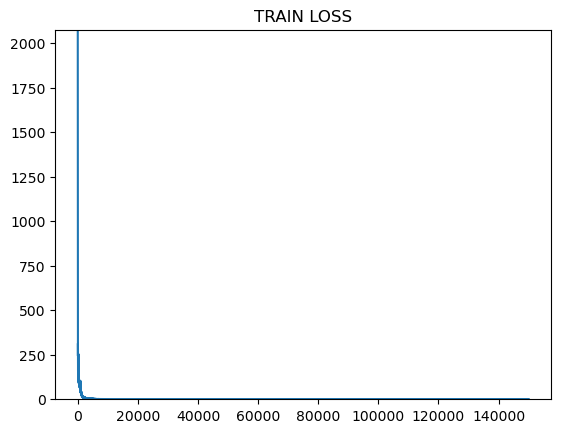

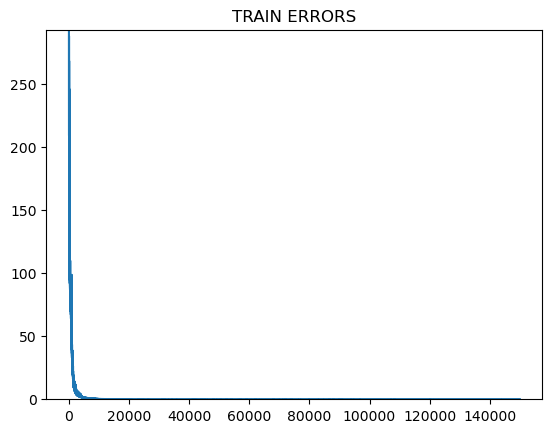

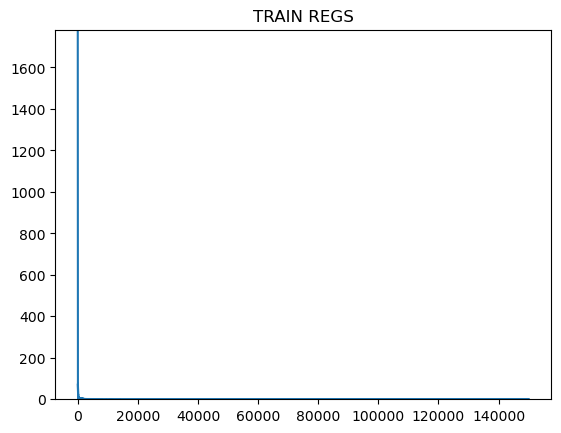

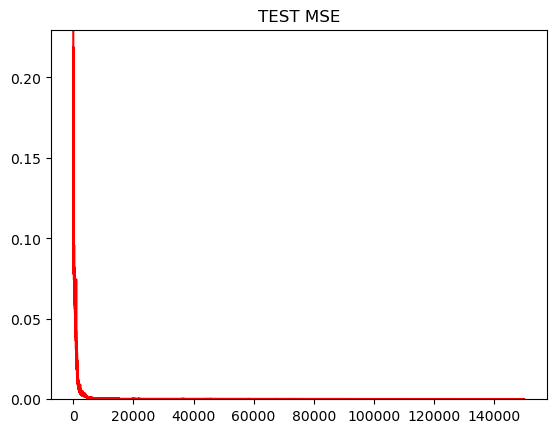

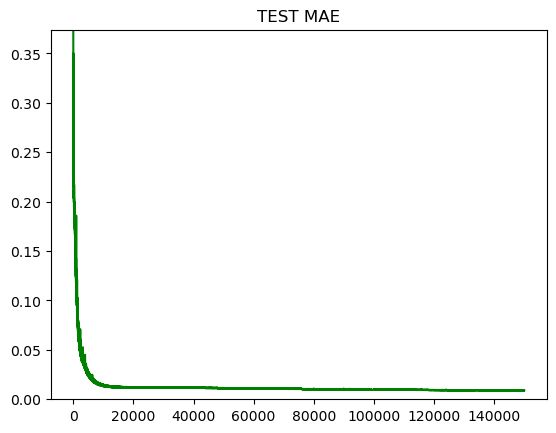

In [46]:
max_idx = 0

plt.figure()
plt.plot(train_losses)
plt.title("TRAIN LOSS")
plt.ylim(0., train_losses[max_idx])
plt.show()

plt.figure()
plt.plot(train_errors)
plt.title("TRAIN ERRORS")
plt.ylim(0., train_errors[max_idx])
plt.show()

if REG_HYPERPARAM > 0:
    plt.figure()
    plt.plot(train_regs)
    plt.title("TRAIN REGS")
    plt.ylim(0., train_regs[max_idx])
    plt.show()

plt.figure()
plt.plot(test_mses, color='r')
plt.title("TEST MSE")
plt.ylim(0., test_mses[max_idx])
plt.show()

plt.figure()
plt.plot(test_maes, color='g')
plt.title("TEST MAE")
plt.ylim(0, test_maes[max_idx])
plt.show()

In [47]:
print("Final Test MSE: ", test_mses[-1])
print("Best Test MSE: ", np.min(test_mses))
print("Best Test MSE Iteration: ", np.argmin(test_mses))

Final Test MSE:  0.0001594229252077639
Best Test MSE:  0.0001552374305902049
Best Test MSE Iteration:  149520


In [48]:
LENGTH = len(gt_freqs)

cn = str(CHIP_NUM) if CHIP_NUM > 9 else "0" + str(CHIP_NUM)
fname = os.path.join(ROOT_PATH, "case"+cn)

children = os.listdir(fname)
children = [f for f in children if cn + ".s" in f]

final_path = os.path.join(fname, children[0])

print(final_path)

fitter = VF.vectorfit.VectorFitter(final_path)
print(y_freqs)
fit1 = fitter.vector_fit("VF Result", y_freqs) 
vf_output = fit1.fitted_network.s
print(vf_output.shape)
print(vf_output.dtype)
vf_data = np.stack((vf_output.real, vf_output.imag), axis=-1)
vf_data = utils.matrix_to_sparams(vf_data)
vf_data = torch.tensor(vf_data).view(1, -1, LENGTH)
vf_data = vf_data.to(device)
print(vf_data.shape)

/scratch/cluster/bodeng/UTAFSDataNew/new_data/case09/case09.s4p
[1.00000000e+01 1.40140150e+08 2.80280290e+08 4.40440450e+08
 7.60760770e+08 7.80780790e+08 9.20920930e+08 1.06106107e+09
 1.18118119e+09 1.36136137e+09 1.38138139e+09 1.50150151e+09
 1.66166167e+09 1.76176177e+09 1.82182183e+09 1.94194195e+09
 1.98198199e+09 2.08208209e+09 2.28228229e+09 2.40240241e+09
 2.44244245e+09 2.58258259e+09 2.72272273e+09 2.88288289e+09
 2.98298299e+09 3.06306307e+09 3.08308309e+09 3.10310311e+09
 3.12312313e+09 3.20320321e+09 3.30330331e+09 3.32332333e+09
 3.34334335e+09 3.50350351e+09 3.62362363e+09 3.68368369e+09
 3.70370371e+09 3.72372373e+09 3.80380381e+09 3.96396397e+09
 4.10410411e+09 4.22422423e+09 4.28428429e+09 4.32432433e+09
 4.34434435e+09 4.36436437e+09 4.38438439e+09 4.40440441e+09
 4.42442443e+09 4.50450451e+09 4.56456457e+09 4.72472473e+09
 4.90490491e+09 4.92492493e+09 4.98498499e+09 5.02502503e+09
 5.20520521e+09 5.24524525e+09 5.32532533e+09 5.50550551e+09
 5.52552553e+09 5.545

/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 323725509163848.9). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.18747852370142937 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 3 poles better than 2 (err 1.5696156951370466 vs 1.5721190546821269)
Performing fit with 3 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 323902848620908.1). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.2964266277849674 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 4 poles better than 3 (err 1.2412960684154608 vs 1.5696156951370466)
Performing fit with 4 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 324136932743735.94). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 2.1255001947283745 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 5 was not subtantially better than 4 (err 1.2744771222303555 vs 1.2412960684154608)
Performing fit with 5 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 324107285106148.2). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 2.435600947588682 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 6 was not subtantially better than 4 (err 1.5354726694214298 vs 1.2412960684154608)
Performing fit with 6 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 324551450598009.25). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.557880038395524 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 7 poles better than 4 (err 0.962574129653974 vs 1.2412960684154608)
Performing fit with 7 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 237434004487248.75). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.8160787709057331 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 8 was not subtantially better than 7 (err 1.534470175358094 vs 0.962574129653974)
Performing fit with 8 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 236458892514460.66). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.9103204384446144 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 9 was not subtantially better than 7 (err 1.0418377282367615 vs 0.962574129653974)
Performing fit with 9 poles.
  Fitting took 0.981146939098835 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 10 poles better than 7 (err 0.7295759760287863 vs 0.962574129653974)
Performing fit with 10 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 235761569902269.56). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 0.8769949190318584 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 11 was not subtantially better than 10 (err 1.0496743928800742 vs 0.7295759760287863)
Performing fit with 11 poles.


/u/bodeng/CurveFitting-DIP/vf_diff_sampling/../VF/vectorfit.py:227: RuntimeWarning: Vector Fitting: The pole relocation process stopped after reaching the maximum number of iterations (N_max = 100). The results did not converge properly. Hint: the linear system was ill-conditioned (max. condition number = 239489454004185.84). This often means that more poles are required.
  vf.vector_fit(n_poles_cmplx=n_poles)


  Fitting took 2.0188332330435514 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 12 was not subtantially better than 10 (err 1.0144479223162581 vs 0.7295759760287863)
Performing fit with 12 poles.
  Fitting took 4.170282917097211 seconds.
  Filling sampled network.
  Filling full sweep network.
  Computing error.
  Fit with 13 was not subtantially better than 10 (err 0.9272459520560504 vs 0.7295759760287863)
Fit completed in 17.340389251708984, using 12, resulting in a fit with 10 and error=0.7295759760287863 vs samples and error=0.7338564866328053 vs ground truth.
(1000, 4, 4)
complex128
torch.Size([1, 20, 1000])


In [49]:
## Make neworks from DIP, Interp, and Observations
DIP_OUT_MATRIX = utils.sparams_to_matrix(out)
VF_MATRIX = utils.sparams_to_matrix(vf_data)
Y_MATRIX = utils.sparams_to_matrix(y)

print(DIP_OUT_MATRIX.shape)
print(VF_MATRIX.shape)
print(Y_MATRIX.shape)

DIP_net = utils.matrix_to_network(DIP_OUT_MATRIX, gt_freqs, "DIP Recon With "+str(M)+" Samples for Chip "+str(CHIP_NUM))
VF_net = utils.matrix_to_network(VF_MATRIX, gt_freqs, "Vector Fit With "+str(M)+" Samples for Chip "+str(CHIP_NUM))
Y_net = utils.matrix_to_network(Y_MATRIX, y_freqs, "Observations for Chip "+str(CHIP_NUM))

DIP_FINAL_OUT = np.stack((DIP_net.s.real, DIP_net.s.imag), axis=-1)
VF_FINAL_OUT = np.stack((VF_net.s.real, VF_net.s.imag), axis=-1)

print(DIP_FINAL_OUT.shape)
print(VF_FINAL_OUT.shape)

dip_data = utils.matrix_to_sparams(DIP_FINAL_OUT)
vf_data_mat = utils.matrix_to_sparams(VF_FINAL_OUT)

print(dip_data.shape)
print(vf_data_mat.shape)
print(dip_data.dtype)
print(vf_data_mat.dtype)

## Compare DIP, VF, and Interp
import skimage.metrics
from skimage.metrics import peak_signal_noise_ratio as psnr

psnr_ours = psnr(gt_data, dip_data)
psnr_vf = psnr(gt_data, vf_data_mat)
print("DIP PSNR:      ", psnr_ours)
print("VF PSNR:       ", psnr_vf)

print("Final DIP MSE: ", test_mses[-1])
print("VF MSE:        ", nn.MSELoss()(vf_data, x).item())
print("Mean DIP MSE: ", nn.MSELoss()(sgld_means_by_sample[-1][np.newaxis], x).item())

torch.Size([1000, 4, 4, 2])
torch.Size([1000, 4, 4, 2])
torch.Size([132, 4, 4, 2])
(1000, 4, 4, 2)
(1000, 4, 4, 2)
(10, 2, 1000)
(10, 2, 1000)
float32
float32
DIP PSNR:       43.99509237247411
VF PSNR:        23.769127742720183
Final DIP MSE:  0.0001594229252077639
VF MSE:         0.016793731600046158
Mean DIP MSE:  0.00015909425565041602


(1000,)
torch.Size([20, 1000])
torch.Size([1, 20, 1000])
torch.Size([1, 20, 132])
torch.Size([1, 20, 1000])
torch.Size([1, 20, 1000])


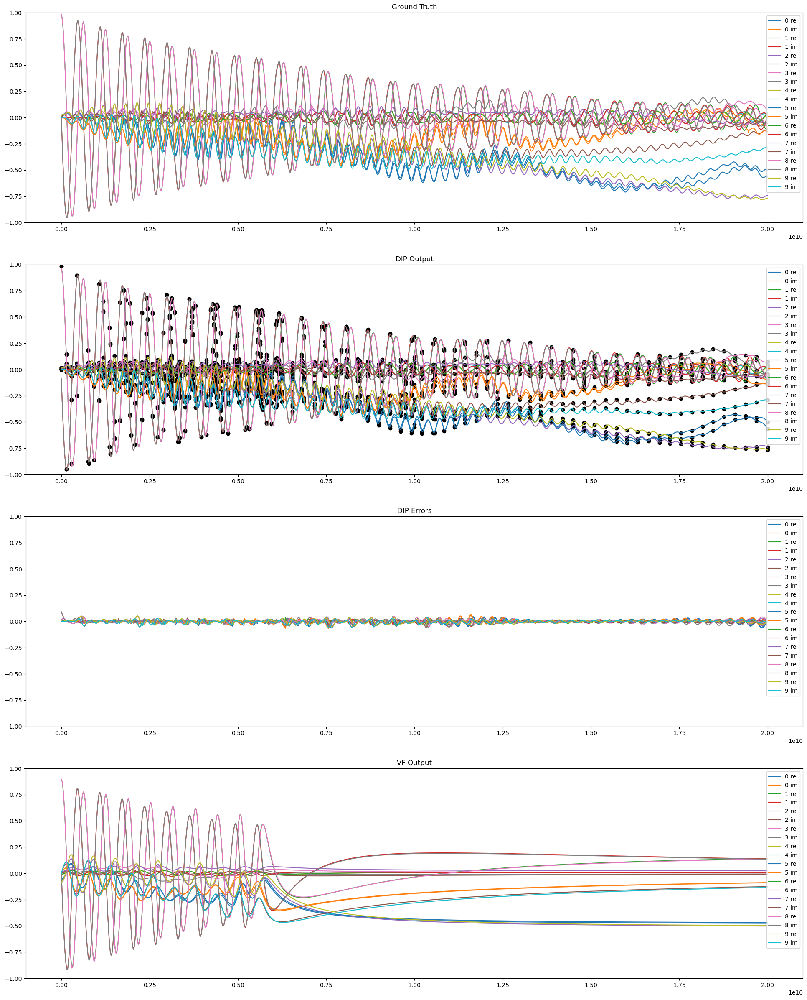

In [55]:
dip_errors = x.detach().cpu() - sgld_means_by_sample[-1].detach().cpu()
print(gt_freqs.shape)
print(sgld_means_by_sample[-1].shape)
print(dip_errors.shape)
print(y.shape)

print(out.shape)
print(vf_data.shape)

fig, axes = plt.subplots(4,1, figsize=(24, 30))
axes = axes.flatten()

for i in range(N_SPARAMS):
    axes[0].plot(gt_freqs, x[0,2*i].cpu(), label=str(i)+" re")
    axes[0].plot(gt_freqs, x[0,2*i+1].cpu(), label=str(i)+" im")
axes[0].set_title("Ground Truth")
axes[0].set_ylim(-1,1)
if N_SPARAMS <= 10:
    axes[0].legend(loc='upper right')

# SHOW WITH MEAN AND STD DEVS
# for i in range(N_SPARAMS):

#     axes[1].plot(gt_freqs, sgld_means_by_sample[-1][2*i].detach().cpu(), label=str(i)+" re")
#     axes[1].plot(gt_freqs, sgld_means_by_sample[-1][2*i+1].detach().cpu(), label=str(i)+" im")
#     axes[1].fill_between(gt_freqs, sgld_means_by_sample[-1][2*i].detach().cpu() - 2 * sgld_stds_by_sample[-1][2*i].detach().cpu(), sgld_means_by_sample[-1][2*i].detach().cpu() + 2 * sgld_stds_by_sample[-1][2*i].detach().cpu())
#     axes[1].fill_between(gt_freqs, sgld_means_by_sample[-1][2*i+1].detach().cpu() - 2 * sgld_stds_by_sample[-1][2*i+1].detach().cpu(), sgld_means_by_sample[-1][2*i+1].detach().cpu() + 2 * sgld_stds_by_sample[-1][2*i+1].detach().cpu())

#     # axes[1].scatter(gt_freqs[kept_inds], y[0,2*i].cpu(), color='black')
#     # axes[1].scatter(gt_freqs[kept_inds], y[0,2*i+1].cpu(), color='black')


# axes[1].set_title("DIP Output")
# axes[1].set_ylim(-1,1)
# if N_SPARAMS <= 10:
#     axes[1].legend(loc='upper right')

for i in range(N_SPARAMS):
    axes[1].plot(gt_freqs, out[0,2*i].detach().cpu(), label=str(i)+" re")
    axes[1].plot(gt_freqs, out[0,2*i+1].detach().cpu(), label=str(i)+" im")
    
    axes[1].scatter(gt_freqs[kept_inds], y[0,2*i].cpu(), color='black')
    axes[1].scatter(gt_freqs[kept_inds], y[0,2*i+1].cpu(), color='black')
axes[1].set_title("DIP Output")
axes[1].set_ylim(-1,1)
if N_SPARAMS <= 10:
    axes[1].legend(loc='upper right')

for i in range(N_SPARAMS):
    axes[2].plot(gt_freqs, dip_errors[0,2*i].detach().cpu(), label=str(i)+" re")
    axes[2].plot(gt_freqs, dip_errors[0,2*i+1].detach().cpu(), label=str(i)+" im")

    
axes[2].set_title("DIP Errors")
axes[2].set_ylim(-1,1)
if N_SPARAMS <= 10:
    axes[2].legend(loc='upper right')

for i in range(N_SPARAMS):
    axes[3].plot(gt_freqs, vf_data[0,2*i].detach().cpu(), label=str(i)+" re")
    axes[3].plot(gt_freqs, vf_data[0,2*i+1].detach().cpu(), label=str(i)+" im")
axes[3].set_title("VF Output")
axes[3].set_ylim(-1,1)
if N_SPARAMS <= 10:
    axes[3].legend(loc='upper right')

In [51]:
torch.set_printoptions(threshold=100000)
print(sgld_stds_by_sample[-1])

tensor([[3.7230e-04, 3.8556e-04, 3.7477e-04, 3.5991e-04, 3.4175e-04, 3.4015e-04,
         3.3351e-04, 3.1463e-04, 2.9537e-04, 4.1264e-04, 3.5090e-04, 2.6774e-04,
         2.7520e-04, 2.8718e-04, 3.0301e-04, 3.0731e-04, 3.4181e-04, 3.2932e-04,
         2.9847e-04, 2.7563e-04, 2.6264e-04, 2.6506e-04, 2.8259e-04, 3.2292e-04,
         3.9791e-04, 4.2418e-04, 4.5910e-04, 4.9355e-04, 4.8863e-04, 4.8280e-04,
         4.7676e-04, 4.7595e-04, 4.7906e-04, 4.7781e-04, 4.6302e-04, 4.1654e-04,
         4.6112e-04, 5.1049e-04, 4.4188e-04, 4.1304e-04, 3.8620e-04, 3.7262e-04,
         2.9834e-04, 2.8439e-04, 2.6660e-04, 3.1994e-04, 3.2595e-04, 3.2733e-04,
         3.2126e-04, 3.0629e-04, 2.8403e-04, 2.6501e-04, 2.5696e-04, 2.7655e-04,
         3.2563e-04, 3.6822e-04, 4.5678e-04, 5.0951e-04, 5.3950e-04, 4.9644e-04,
         5.1617e-04, 5.9074e-04, 5.5870e-04, 5.2074e-04, 4.7022e-04, 4.5780e-04,
         4.6905e-04, 4.4936e-04, 4.0540e-04, 3.8376e-04, 4.3606e-04, 3.9492e-04,
         4.1749e-04, 4.0482e

In [52]:
print(dip_errors[-1])

tensor([[-2.8932e-04,  8.3035e-03,  7.3393e-03,  6.4449e-03,  5.3822e-03,
          4.4368e-03,  3.1991e-03,  2.6167e-03,  2.9928e-03,  3.8929e-03,
          4.7537e-03,  4.5163e-03,  4.2546e-03,  2.9870e-03,  2.2092e-03,
          1.2450e-03,  1.4597e-03,  5.0628e-04,  1.4009e-04,  1.8048e-04,
         -2.1682e-04,  3.9237e-04,  1.8847e-03,  1.9502e-03,  5.9611e-03,
          1.0640e-02,  1.4542e-02,  1.6128e-02,  1.6062e-02,  1.3257e-02,
          8.7583e-03,  3.8781e-03, -6.7438e-04, -7.0746e-03, -1.2355e-02,
         -1.1493e-02, -9.2025e-03, -6.4349e-03, -2.8645e-03, -6.2032e-04,
          1.2093e-03,  3.0020e-03,  4.1575e-03,  4.4123e-03,  3.6281e-03,
          1.8573e-03,  8.5037e-04, -1.2203e-03,  2.0197e-03, -1.1074e-02,
         -1.1945e-02, -1.0522e-02, -8.3249e-03, -5.1603e-03, -3.2133e-03,
          1.8146e-05,  3.2657e-03,  5.8632e-03,  7.1741e-03,  6.5919e-03,
          6.5785e-03,  5.4027e-03,  2.4916e-03,  2.7575e-05, -1.3299e-05,
         -1.0870e-02, -1.3381e-02, -9.

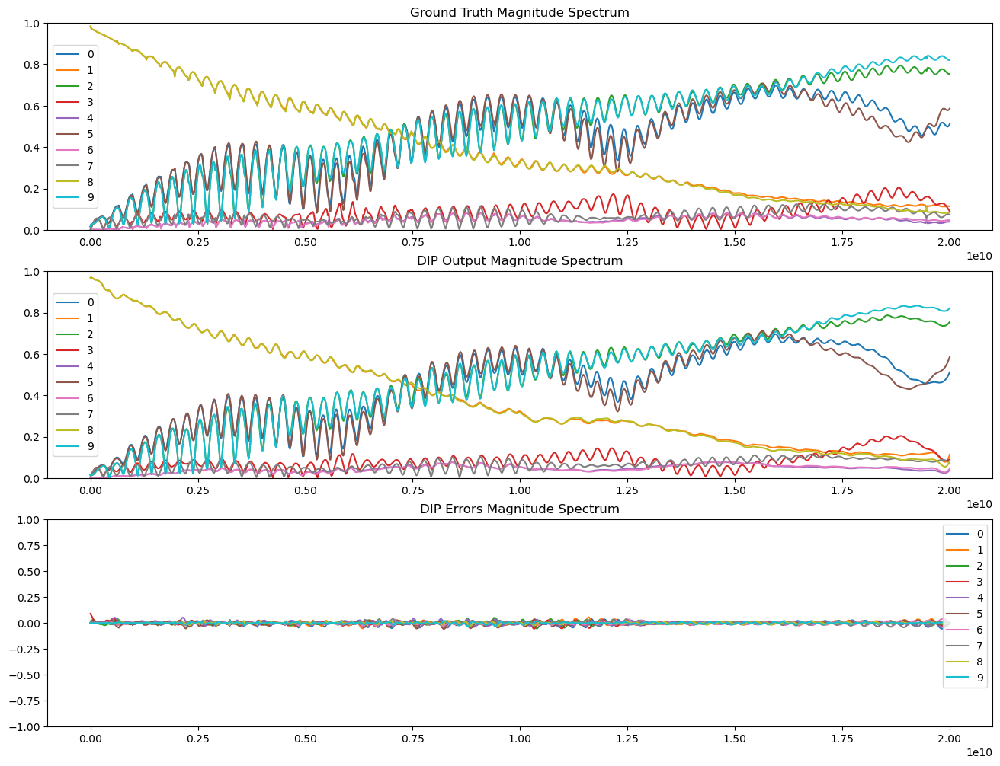

In [53]:
out_mag = utils.sparams_to_mag(out)
dip_errors_mag = x_mag - out_mag 

fig, axes = plt.subplots(3,1, figsize=(16, 12))
axes = axes.flatten()

for i in range(N_SPARAMS):
    axes[0].plot(gt_freqs, x_mag[0,i].cpu(), label=str(i))
axes[0].set_title("Ground Truth Magnitude Spectrum")
axes[0].set_ylim(0,1)
if N_SPARAMS <= 10:
    axes[0].legend()

for i in range(N_SPARAMS):
    axes[1].plot(gt_freqs, out_mag[0,i].detach().cpu(), label=str(i))
axes[1].set_title("DIP Output Magnitude Spectrum")
axes[1].set_ylim(0,1)
if N_SPARAMS <= 10:
    axes[1].legend()
    
for i in range(N_SPARAMS):
    axes[2].plot(gt_freqs, dip_errors[0,i].detach().cpu(), label=str(i))
axes[2].set_title("DIP Errors Magnitude Spectrum")
axes[2].set_ylim(-1,1)
if N_SPARAMS <= 10:
    axes[2].legend()

In [54]:
print(kept_inds)

[  0   7  14  22  38  39  46  53  59  68  69  75  83  88  91  97  99 104
 114 120 122 129 136 144 149 153 154 155 156 160 165 166 167 175 181 184
 185 186 190 198 205 211 214 216 217 218 219 220 221 225 228 236 245 246
 249 251 260 262 266 275 276 277 278 279 280 281 282 283 284 285 290 297
 304 305 307 308 312 327 340 343 358 368 373 388 396 403 404 419 422 433
 434 449 454 465 480 487 495 499 510 526 528 541 556 571 587 602 617 632
 648 663 678 693 709 724 739 754 770 785 800 815 831 846 861 876 892 907
 922 937 953 968 983 999]
